# Data Preprocessing & EDA

## Attaching Resources

### Importing Necessary Libraries

In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import IsolationForest

import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (16, 8)
plt.rcParams['figure.dpi'] = 250
sns.set_style(style='darkgrid')
plt.tight_layout()
%matplotlib inline

### Adding Dataset

In [ ]:
book_raw = pd.read_csv("Books.csv", encoding='latin-1')

book_raw.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [ ]:
ratings_raw = pd.read_csv("Ratings.csv", encoding='latin-1')

ratings_raw.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [ ]:
users_raw = pd.read_csv('Users.csv', encoding='latin-1')

users_raw.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [ ]:
ratings = pd.read_excel('Ratings.xlsx')
ratings.drop(columns=['Unnamed: 0'], inplace = True)

ratings

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,0.000000
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,4.928571
2,60973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,5.000000
3,374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,4.272727
4,393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,0.000000
...,...,...,...,...,...,...
271357,440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),7.000000
271358,525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,4.000000
271359,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,0.000000
271360,192126040,Republic (World's Classics),Plato,1996,Oxford University Press,0.000000


## Performing EDA In Dataset

### Performing Data Preprocessing

#### Applying Descriptive Statistics

In [ ]:
book_raw.describe()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
count,271360,271360,271359,271360,271358,271360,271360,271357
unique,271360,242135,102023,202,16807,271044,271044,271041
top,0195153448,Selected Poems,Agatha Christie,2002,Harlequin,http://images.amazon.com/images/P/185326119X.0...,http://images.amazon.com/images/P/185326119X.0...,http://images.amazon.com/images/P/225307649X.0...
freq,1,27,632,13903,7535,2,2,2


In [ ]:
ratings_raw.describe()

,User-ID,Book-Rating
count,1.149780e+06,1.149780e+06
mean,1.403864e+05,2.866950e+00
std,8.056228e+04,3.854184e+00
min,2.000000e+00,0.000000e+00
25%,7.034500e+04,0.000000e+00
50%,1.410100e+05,0.000000e+00
75%,2.110280e+05,7.000000e+00
max,2.788540e+05,1.000000e+01


In [ ]:
users_raw.describe()

,User-ID,Age
count,278858.00000,168096.000000
mean,139429.50000,34.751434
std,80499.51502,14.428097
min,1.00000,0.000000
25%,69715.25000,24.000000
50%,139429.50000,32.000000
75%,209143.75000,44.000000
max,278858.00000,244.000000


#### Performing Typecasting

In [ ]:
book_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [ ]:
ratings_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


In [ ]:
users_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


#### Performing Missing Value Imputation

In [ ]:
def missing_percentage(wp):

    m = wp.isna().sum()
    total = int(wp.shape[0])

    for i in range(len(wp.columns)):
        percentage =round((m[i]/total)*100)

        print(str(wp.columns[i]) + ' has ' + str(percentage) + ' % missing value(' + str(m[i]) + ')')

##### Missing Value Percentage

In [ ]:
missing_percentage(book_raw)

ISBN has 0 % missing value(0)
Book-Title has 0 % missing value(0)
Book-Author has 0 % missing value(1)
Year-Of-Publication has 0 % missing value(0)
Publisher has 0 % missing value(2)
Image-URL-S has 0 % missing value(0)
Image-URL-M has 0 % missing value(0)
Image-URL-L has 0 % missing value(3)


In [ ]:
missing_percentage(ratings_raw)

User-ID has 0 % missing value(0)
ISBN has 0 % missing value(0)
Book-Rating has 0 % missing value(0)


In [ ]:
missing_percentage(users_raw)

User-ID has 0 % missing value(0)
Location has 0 % missing value(0)
Age has 40 % missing value(110762)


In [ ]:
missing_percentage(ratings)

ISBN has 0 % missing value(0)
Book-Title has 0 % missing value(4)
Book-Author has 0 % missing value(2)
Year-Of-Publication has 0 % missing value(0)
Publisher has 0 % missing value(2)
rating has 0 % missing value(1209)


##### Missing Value Percentage(After)

In [ ]:
missing_percentage(ratings)

ISBN has 0 % missing value(0)
Book-Title has 0 % missing value(4)
Book-Author has 0 % missing value(2)
Year-Of-Publication has 0 % missing value(0)
Publisher has 0 % missing value(2)
rating has 0 % missing value(1209)


#### Finding Unique Values In Dataset

In [ ]:
def uni(df):

    for i in range(len(df.columns)):
        print('\n All Unique Value in ' + str(df.columns[i]))
        print(df[df.columns[i]].unique())
        print('Total no of unique values ' +
              str(len(df[df.columns[i]].unique())))


In [ ]:
uni(book_raw)


 All Unique Value in ISBN
['0195153448' '0002005018' '0060973129' ... '006008667X' '0192126040'
 '0767409752']
Total no of unique values 271360

 All Unique Value in Book-Title
['Classical Mythology' 'Clara Callan' 'Decision in Normandy' ...
 'Lily Dale : The True Story of the Town that Talks to the Dead'
 "Republic (World's Classics)"
 "A Guided Tour of Rene Descartes' Meditations on First Philosophy with Complete Translations of the Meditations by Ronald Rubin"]
Total no of unique values 242135

 All Unique Value in Book-Author
['Mark P. O. Morford' 'Richard Bruce Wright' "Carlo D'Este" ...
 'David Biggs' 'Teri Sloat' 'Christopher  Biffle']
Total no of unique values 102024

 All Unique Value in Year-Of-Publication
[2002 2001 1991 1999 2000 1993 1996 1988 2004 1998 1994 2003 1997 1983
 1979 1995 1982 1985 1992 1986 1978 1980 1952 1987 1990 1981 1989 1984 0
 1968 1961 1958 1974 1976 1971 1977 1975 1965 1941 1970 1962 1973 1972
 1960 1966 1920 1956 1959 1953 1951 1942 1963 1964 1969 19

In [ ]:
uni(ratings_raw)


 All Unique Value in User-ID
[276725 276726 276727 ... 276709 276721 276723]
Total no of unique values 105283

 All Unique Value in ISBN
['034545104X' '0155061224' '0446520802' ... '0679752714' '0806917695'
 '05162443314']
Total no of unique values 340556

 All Unique Value in Book-Rating
[ 0  5  3  6  8  7 10  9  4  1  2]
Total no of unique values 11


In [ ]:
uni(users_raw)


 All Unique Value in User-ID
[     1      2      3 ... 278856 278857 278858]
Total no of unique values 278858

 All Unique Value in Location
['nyc, new york, usa' 'stockton, california, usa'
 'moscow, yukon territory, russia' ... 'sergnano, lombardia, italy'
 'stranraer, n/a, united kingdom' 'tacoma, washington, united kingdom']
Total no of unique values 57339

 All Unique Value in Age
[ nan  18.  17.  61.  26.  14.  25.  19.  46.  55.  32.  24.  20.  34.
  23.  51.  31.  21.  44.  30.  57.  43.  37.  41.  54.  42.  50.  39.
  53.  47.  36.  28.  35.  13.  58.  49.  38.  45.  62.  63.  27.  33.
  29.  66.  40.  15.  60.   0.  79.  22.  16.  65.  59.  48.  72.  56.
  67.   1.  80.  52.  69.  71.  73.  78.   9.  64. 103. 104.  12.  74.
  75. 231.   3.  76.  83.  68. 119.  11.  77.   2.  70.  93.   8.   7.
   4.  81. 114. 230. 239.  10.   5. 148. 151.   6. 101. 201.  96.  84.
  82.  90. 123. 244. 133.  91. 128.  94.  85. 141. 110.  97. 219.  86.
 124.  92. 175. 172. 209. 212. 237.  87. 1

#### Filltering Out All Problme

In [ ]:
ratings[ratings['Year-Of-Publication'] == 'Gallimard']

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
220733,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-M...",2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...,0.0


In [ ]:
ratings['Publisher'][220733] = ratings['Year-Of-Publication'][220733]
ratings['Year-Of-Publication'][220733] = ratings['Book-Author'][220733]
ratings['Book-Author'][220733] = np.nan

In [ ]:
ratings.iloc[220733,:]

ISBN                                                          2070426769
Book-Title             Peuple du ciel, suivi de 'Les Bergers\";Jean-M...
Book-Author                                                          NaN
Year-Of-Publication                                                 2003
Publisher                                                      Gallimard
rating                                                               0.0
Name: 220733, dtype: object

In [ ]:
ratings[ratings['Year-Of-Publication'] == 'DK Publishing Inc']

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
209540,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,3.5
221680,789466953,"DK Readers: Creating the X-Men, How Comic Book...",2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.0...,0.0


In [ ]:
ratings['Publisher'][209540] = ratings['Year-Of-Publication'][209540]
ratings['Year-Of-Publication'][209540] = ratings['Book-Author'][209540]
ratings['Book-Author'][209540] = np.nan

ratings['Publisher'][221680] = ratings['Year-Of-Publication'][221680]
ratings['Year-Of-Publication'][221680] = ratings['Book-Author'][221680]
ratings['Book-Author'][221680] = np.nan

In [ ]:
ratings.iloc[[209540,221680],:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
209540,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",NaN,2000,DK Publishing Inc,3.5
221680,789466953,"DK Readers: Creating the X-Men, How Comic Book...",NaN,2000,DK Publishing Inc,0.0


In [ ]:
ratings[ratings['ISBN'] == '078946697X']

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
209540,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",NaN,2000,DK Publishing Inc,3.5


In [ ]:
drop_bkt = ratings[ratings['Book-Title'].isna()].index

In [ ]:
ratings.drop(drop_bkt, inplace=True)

In [ ]:
ratings[ratings['Book-Author'].isna()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
118035,751352497,A+ Quiz Masters:01 Earth,NaN,1999,Dorling Kindersley,10.0
187691,9627982032,The Credit Suisse Guide to Managing Your Perso...,NaN,1995,Edinburgh Financial Publishing,8.0
209540,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",NaN,2000,DK Publishing Inc,3.5
220733,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-M...",NaN,2003,Gallimard,0.0
221680,789466953,"DK Readers: Creating the X-Men, How Comic Book...",NaN,2000,DK Publishing Inc,0.0


In [ ]:
ratings['Book-Author'].fillna('Unknown', inplace=True)

In [ ]:
ratings[ratings['Book-Author'].isna()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating


In [ ]:
ratings[ratings['Publisher'].isna()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
128892,193169656X,Tyrant Moon,Elaine Corvidae,2002,NaN,9.0
129039,1931696993,Finders Keepers,Linnea Sinclair,2001,NaN,9.0


In [ ]:
ratings['Publisher'].fillna('Unknown', inplace=True)

ratings[ratings['Publisher'].isna()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating


### Checking for Duplicated Values

In [ ]:
book_raw[book_raw.duplicated()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L


In [ ]:
ratings_raw[ratings_raw.duplicated()]

,User-ID,ISBN,Book-Rating


In [ ]:
users_raw[users_raw.duplicated()]

,User-ID,Location,Age


In [ ]:
ratings[ratings.duplicated()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
20000,312289510,The Christmas Shoes,Donna VanLiere,2001,St. Martin's Press,3.827586
30001,967205905,Effort-Less Marketing for Financial Advisors,Steve Moeller,1999,American Business Visions,0.000000


In [ ]:
ratings.drop_duplicates(inplace = True)

In [ ]:
ratings[ratings.duplicated()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating


- There is no duplicate vale in are dataset

### Visualizing The Data

#### Visualizing User

##### Filltering Location

In [ ]:
loc = []

for i in range(len(users_raw['Location'])):

    msg = re.sub('[^a-zA-Z,]','',users_raw['Location'][i])
    loc.append(msg)

In [ ]:
location = []

for i in range(len(loc)):
    txt = loc[i].split(',')
    location.append(txt)

place = pd.DataFrame(location, columns=['a','b','c','d','e','f','g','h','i'])

place

,a,b,c,d,e,f,g,h,i
0,nyc,newyork,usa,None,None,None,None,None,None
1,stockton,california,usa,None,None,None,None,None,None
2,moscow,yukonterritory,russia,None,None,None,None,None,None
3,porto,vngaia,portugal,None,None,None,None,None,None
4,farnborough,hants,unitedkingdom,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...
278853,portland,oregon,usa,None,None,None,None,None,None
278854,tacoma,washington,unitedkingdom,None,None,None,None,None,None
278855,brampton,ontario,canada,None,None,None,None,None,None
278856,knoxville,tennessee,usa,None,None,None,None,None,None


In [ ]:
user_loc = pd.DataFrame({
    'User-ID' : users_raw['User-ID'],
    'area' : place['a'],
    'city' : place['b'],
    'country' : place['c']
}
)

user_loc

,User-ID,area,city,country
0,1,nyc,newyork,usa
1,2,stockton,california,usa
2,3,moscow,yukonterritory,russia
3,4,porto,vngaia,portugal
4,5,farnborough,hants,unitedkingdom
...,...,...,...,...
278853,278854,portland,oregon,usa
278854,278855,tacoma,washington,unitedkingdom
278855,278856,brampton,ontario,canada
278856,278857,knoxville,tennessee,usa


In [ ]:
user_loc[user_loc['country'].isna()]

,User-ID,area,city,country
29419,29420,stlouis,missouri,None
134376,134377,lawrenceville,None,None


In [ ]:
user_loc['country'].fillna(user_loc['area'], inplace=True)

In [ ]:
user_loc[user_loc['country'].isna()]

,User-ID,area,city,country


In [ ]:
user_loc['country'].value_counts().head(10)

 usa               139187
 canada             21558
 united kingdom     18286
 germany            17022
 spain              13095
 australia          11723
 italy              11242
                     4598
 france              3442
 portugal            3306
Name: country, dtype: int64

###### USA

In [ ]:
user_loc[user_loc['country'] == ' usa'].iloc[:,2].value_counts().head(10)

 california      19662
 texas            8290
 new york         7756
 florida          6927
 pennsylvania     5975
 illinois         5793
 washington       5735
 ohio             4601
 michigan         4537
 oregon           4270
Name: city, dtype: int64

In [ ]:
california =  user_loc[user_loc['city'] == ' california']

california.reset_index(inplace=True)
california.drop(columns='index', inplace = True)

california

,User-ID,area,city,country
0,2,stockton,california,usa
1,6,santa monica,california,usa
2,12,fort bragg,california,usa
3,25,oakland,california,usa
4,33,costa mesa,california,usa
...,...,...,...,...
19893,278807,pollock pines,california,usa
19894,278814,san jose,california,usa
19895,278826,san francisco,california,usa
19896,278840,encinitas,california,usa


In [ ]:
california_book = []

for i in range(len(california['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == california['User-ID'][i]]
    for j in b['ISBN']:
        california_book.append(j)

In [ ]:
cal_book = pd.DataFrame({'ISBN': california_book})

california_top_book = pd.DataFrame(cal_book.value_counts().head(5), columns=['book_count'])
california_top_book.reset_index(inplace = True)
california_top_book['Book-Title'] = california_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

california_top_book

,ISBN,book_count,Book-Title
0,0971880107,161,Wild Animus
1,0316666343,130,The Lovely Bones: A Novel
2,0060928336,107,Divine Secrets of the Ya-Ya Sisterhood: A Novel
3,0385504209,101,The Da Vinci Code
4,0312195516,99,The Red Tent (Bestselling Backlist)


###### Canada

In [ ]:
user_loc[user_loc['country'] == ' canada'].iloc[:,2].value_counts().head(5)

 ontario             8664
 british columbia    5313
 alberta             2548
 quebec              1371
 nova scotia          982
Name: city, dtype: int64

In [ ]:
ontario =  user_loc[user_loc['city'] == ' ontario']

ontario.reset_index(inplace=True)
ontario.drop(columns='index', inplace = True)

ontario

,User-ID,area,city,country
0,8,timmins,ontario,canada
1,71,toronto,ontario,canada
2,79,ottawa,ontario,canada
3,80,etobicoke,ontario,canada
4,197,brantford,ontario,canada
...,...,...,...,...
8731,278725,toronto,ontario,canada
8732,278786,st catharines,ontario,canada
8733,278846,toronto,ontario,canada
8734,278849,georgetown,ontario,canada


In [ ]:
ontario_book = []

for i in range(len(ontario['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == ontario['User-ID'][i]]
    for j in b['ISBN']:
        ontario_book.append(j)

In [ ]:
ont_book = pd.DataFrame({'ISBN': ontario_book})

ontario_top_book = pd.DataFrame(ont_book.value_counts().head(5), columns=['book_count'])
ontario_top_book.reset_index(inplace = True)
ontario_top_book['Book-Title'] = ontario_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

ontario_top_book

,ISBN,book_count,Book-Title
0,0971880107,98,Wild Animus
1,0316666343,61,The Lovely Bones: A Novel
2,0671021001,39,She's Come Undone (Oprah's Book Club)
3,0312195516,36,The Red Tent (Bestselling Backlist)
4,0440214041,35,The Pelican Brief


###### United Kingdom

In [ ]:
user_loc[user_loc['country'] == ' united kingdom'].iloc[:,2].value_counts().head(5)

 england     10562
 scotland     1353
 n a          1174
 wales         601
 london        423
Name: city, dtype: int64

In [ ]:
england =  user_loc[user_loc['city'] == ' england']

england.reset_index(inplace=True)
england.drop(columns='index', inplace = True)

england

,User-ID,area,city,country
0,34,london,england,united kingdom
1,50,london,england,united kingdom
2,72,gloucester,england,united kingdom
3,85,london,england,united kingdom
4,105,hull,england,united kingdom
...,...,...,...,...
10686,278611,leicester,england,united kingdom
10687,278612,crowborough,england,united kingdom
10688,278793,bury,england,united kingdom
10689,278809,norfolk,england,england


In [ ]:
england_book = []

for i in range(len(england['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == england['User-ID'][i]]
    for j in b['ISBN']:
        england_book.append(j)

In [ ]:
eng_book = pd.DataFrame({'ISBN': england_book})

england_top_book = pd.DataFrame(eng_book.value_counts().head(5), columns=['book_count'])
england_top_book.reset_index(inplace = True)
england_top_book['Book-Title'] = england_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

england_top_book

,ISBN,book_count,Book-Title
0,0971880107,115,Wild Animus
1,0099771519,47,Memoirs of a Geisha Uk
2,1844262553,43,Free
3,0330332775,42,Bridget Jones's Diary
4,0552998486,42,Chocolat


###### Germany

In [ ]:
user_loc[user_loc['country'] == ' germany'].iloc[:,2].value_counts().head(5)

 nordrhein westfalen    3885
 bayern                 2024
 baden wuerttemberg     1891
 hessen                 1392
 niedersachsen          1287
Name: city, dtype: int64

In [ ]:
nord = user_loc[user_loc['city'] == ' nordrhein westfalen']

nord.reset_index(inplace=True)
nord.drop(columns='index', inplace = True)

nord

,User-ID,area,city,country
0,603,bielefeld,nordrhein westfalen,germany
1,633,k ln,nordrhein westfalen,germany
2,634,d sseldorf,nordrhein westfalen,germany
3,754,leverkusen,nordrhein westfalen,germany
4,899,bielefeld,nordrhein westfalen,germany
...,...,...,...,...
3934,278703,emmerich,nordrhein westfalen,germany
3935,278719,bonn,nordrhein westfalen,germany
3936,278721,kamen,nordrhein westfalen,germany
3937,278778,k ln,nordrhein westfalen,germany


In [ ]:
nord_book = []

for i in range(len(nord['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == nord['User-ID'][i]]
    for j in b['ISBN']:
       nord_book.append(j)

In [ ]:
nor_book = pd.DataFrame({'ISBN': nord_book })

nord_top_book = pd.DataFrame(nor_book.value_counts().head(7), columns=['book_count'])
nord_top_book.reset_index(inplace = True)
nord_top_book.drop(index=[1,2],inplace=True)
nord_top_book['Book-Title'] = nord_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

nord_top_book

,ISBN,book_count,Book-Title
0,0971880107,53,Wild Animus
3,3442541751,19,Russendisko.
4,3492238696,17,Balzac und die kleine chinesische Schneiderin.
5,3442453305,16,Herr Lehmann.
6,3404148665,16,Illuminati.


###### Spain

In [ ]:
user_loc[user_loc['country'] == ' spain'].iloc[:,2].value_counts().head(5)

 madrid       1692
 barcelona    1508
 catalunya    1193
 n a          1083
 valencia      472
Name: city, dtype: int64

In [ ]:
madrid =  user_loc[user_loc['city'] == ' madrid']

madrid.reset_index(inplace=True)
madrid.drop(columns='index', inplace = True)

madrid

,User-ID,area,city,country
0,406,madrid,madrid,spain
1,609,madrid,madrid,spain
2,856,madrid,madrid,spain
3,919,madrid,madrid,spain
4,1102,madrid,madrid,spain
...,...,...,...,...
1713,278204,madrid,madrid,spain
1714,278492,madrid,madrid,spain
1715,278668,madrid,madrid,spain
1716,278676,madrid,madrid,spain


In [ ]:
madrid_book = []

for i in range(len(madrid['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == madrid['User-ID'][i]]
    for j in b['ISBN']:
        madrid_book.append(j)

In [ ]:
mad_book = pd.DataFrame({'ISBN': madrid_book})

madrid_top_book = pd.DataFrame(mad_book.value_counts().head(5), columns=['book_count'])
madrid_top_book.reset_index(inplace = True)
madrid_top_book['Book-Title'] = madrid_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

madrid_top_book

,ISBN,book_count,Book-Title
0,8420478725,8,LA Caverna De Las Ideas
1,8433925180,8,El Antropologo Inocente
2,8495501074,7,Ensayo sobre la ceguera
3,8495618605,7,El Codigo Da Vinci / The Da Vinci Code
4,950491036X,6,La Sombra del Viento


##### Ploting Location

<AxesSubplot:title={'center':'Top 5 Countries'}, ylabel='country'>

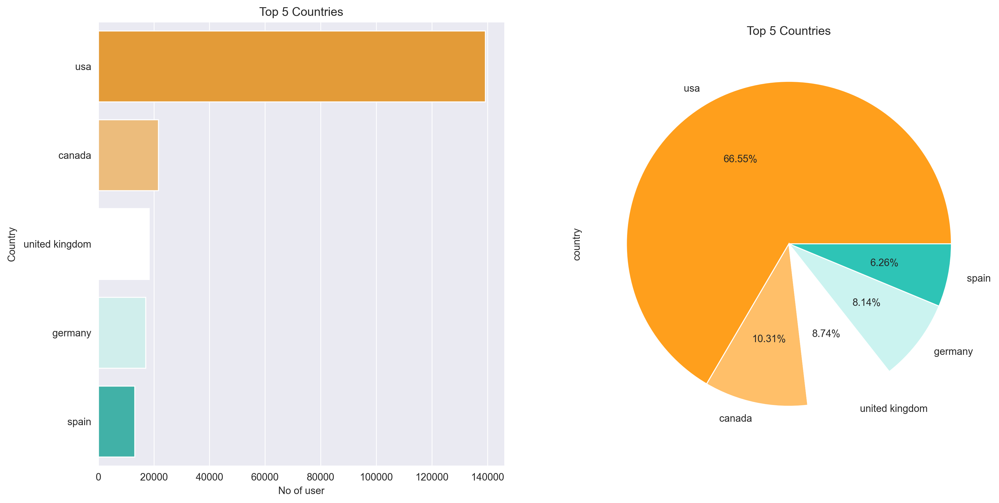

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Top 5 Countries')
plt.setp(ax[0], xlabel = 'No of user')
plt.setp(ax[0], ylabel = 'Country')
sns.barplot(y = user_loc['country'].value_counts().head(5).index,
            x = user_loc['country'].value_counts().head(5).values,
            ax = ax[0],
            palette=['#ff9f1c','#ffbf69','#ffffff','#cbf3f0','#2ec4b6'])

plt.setp(ax[1], title = "Top 5 Countries")
user_loc['country'].value_counts().head(5).plot(kind='pie', autopct = '%.2f%%', ax = ax[1],
            colors=['#ff9f1c','#ffbf69','#ffffff','#cbf3f0','#2ec4b6'])

- This is a graph that displays **the top five countries and their percentages**.

- We wanted to determine the **location and level** of user concentration.

- We can utilise it for **area vice recommendation**, as we'll demonstrate below.

###### Ploting California

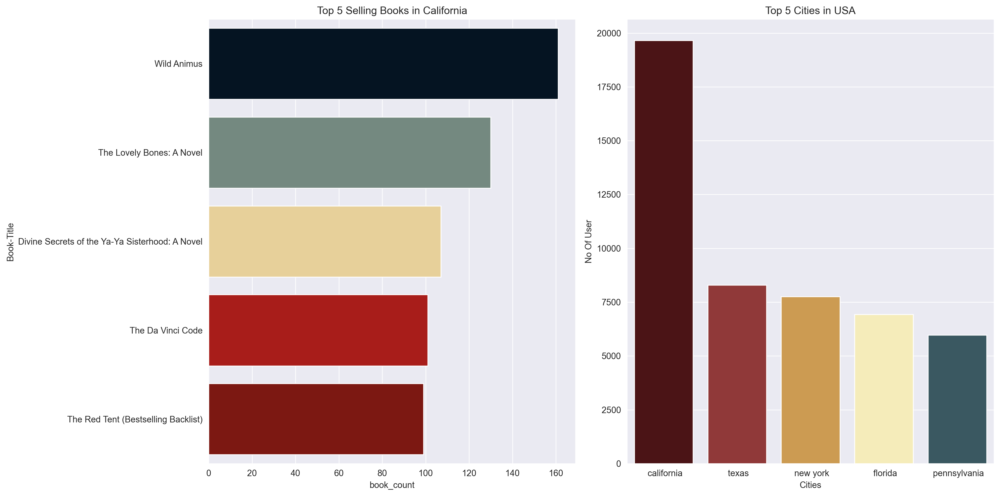

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Cities in USA')
plt.setp(ax[1], xlabel = 'Cities')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x =user_loc[user_loc['country'] == ' usa'].iloc[:,2].value_counts().head(5).index,
            y= user_loc[user_loc['country'] == ' usa'].iloc[:,2].value_counts().head(5).values,
            ax = ax[1],
            palette=['#540b0e','#9e2a2b','#e09f3e','#fff3b0','#335c67'])

plt.setp(ax[0], title = 'Top 5 Selling Books in California')
plt.setp(ax[0], xlabel = 'Book Title')
plt.setp(ax[0], ylabel = '')
sns.barplot(y = california_top_book['Book-Title'],
            x = california_top_book['book_count'],
            ax = ax[0],
            palette=['#001427','#708d81','#f4d58d','#bf0603','#8d0801'])

plt.tight_layout()

- This graph shows **California's best-selling** book and the top **five American cities**.

- We were looking for the **most active users** and **best seller** top city.

- We can recommend user books **depending on location** using the data, same as Instagram, Youtube and other services do for us when they suggest videos in real life.

###### Ploting Canada

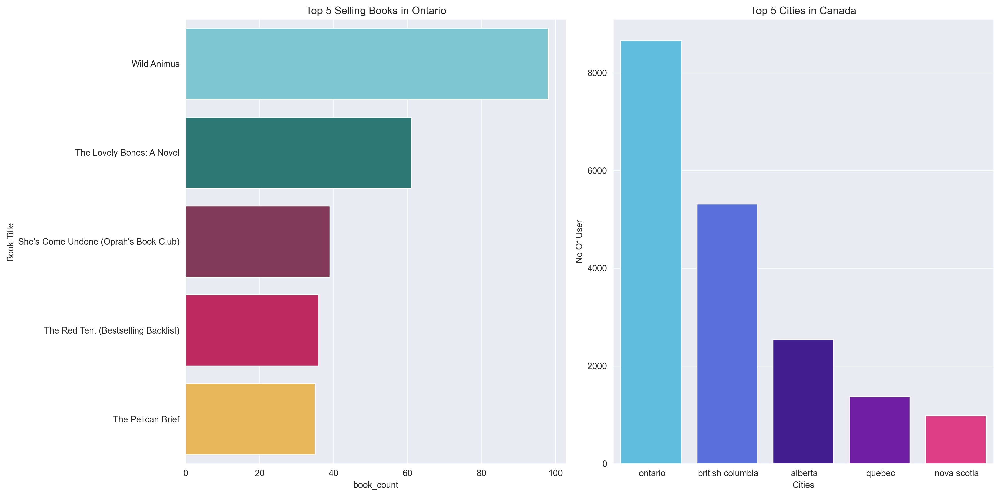

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Cities in Canada')
plt.setp(ax[1], xlabel = 'Cities')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x =user_loc[user_loc['country'] == ' canada'].iloc[:,2].value_counts().head(5).index,
            y= user_loc[user_loc['country'] == ' canada'].iloc[:,2].value_counts().head(5).values,
            ax = ax[1],
            palette=['#4cc9f0','#4361ee','#3a0ca3','#7209b7','#f72585'])

plt.setp(ax[0], title = 'Top 5 Selling Books in Ontario')
plt.setp(ax[0], xlabel = 'Book Title')
plt.setp(ax[0], ylabel = '')
sns.barplot(y = ontario_top_book['Book-Title'],
            x = ontario_top_book['book_count'], ax = ax[0],
            palette=['#73d2de','#218380','#8f2d56','#d81159','#ffbc42'])

plt.tight_layout()

- This graph shows **Ontario's best-selling** book and the top **five Canadian cities**.

- We were looking for the **most active users** and **best seller** top city.

- We can recommend user books **depending on location** using the data, same as Instagram, Youtube and other services do for us when they suggest videos in real life.

###### Ploting United Kingdom

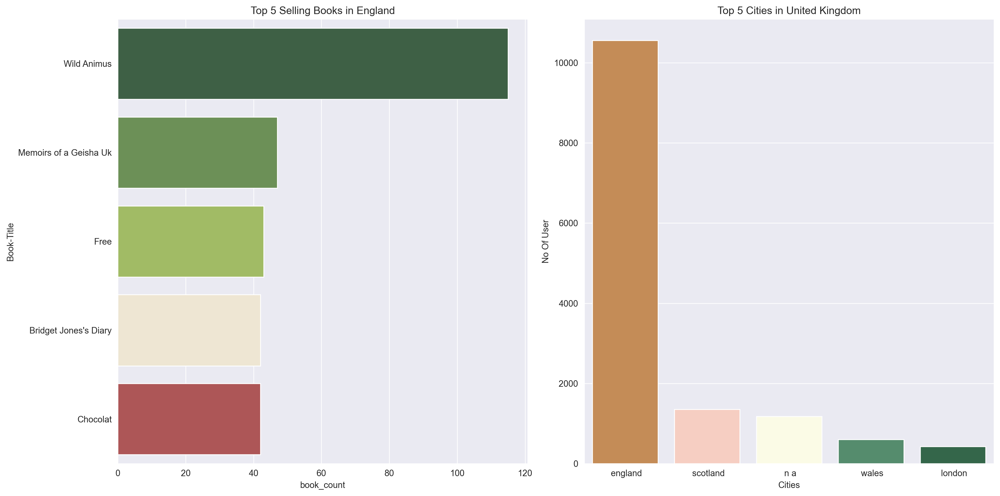

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Cities in United Kingdom')
plt.setp(ax[1], xlabel = 'Cities')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x =user_loc[user_loc['country'] == ' united kingdom'].iloc[:,2].value_counts().head(5).index,
            y= user_loc[user_loc['country'] == ' united kingdom'].iloc[:,2].value_counts().head(5).values,
            ax = ax[1],
            palette=['#d68c45','#ffc9b9','#fefee3','#4c956c','#2c6e49'])

plt.setp(ax[0], title = 'Top 5 Selling Books in England')
plt.setp(ax[0], xlabel = 'Book Title')
plt.setp(ax[0], ylabel = '')
sns.barplot(y = england_top_book['Book-Title'],
            x = england_top_book['book_count'], ax = ax[0],
            palette=['#386641','#6a994e','#a7c957','#f2e8cf','#bc4749'])

plt.tight_layout()


- This graph shows **England's best-selling** book and the top **five United Kingdom cities**.

- We were looking for the **most active users** and **best seller** top city.

- We can recommend user books **depending on location** using the data, same as Instagram, Youtube and other services do for us when they suggest videos in real life.

###### Ploting Germany

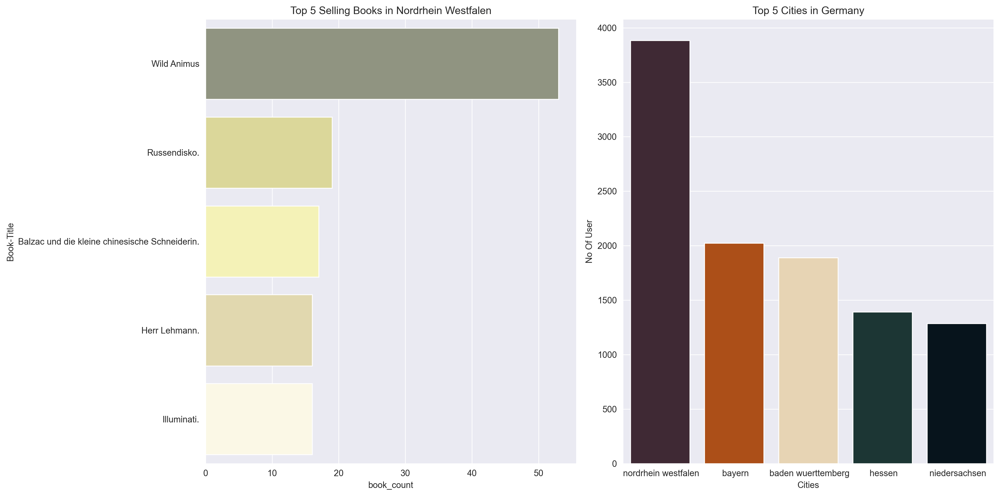

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Cities in Germany')
plt.setp(ax[1], xlabel = 'Cities')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x =user_loc[user_loc['country'] == ' germany'].iloc[:,2].value_counts().head(5).index,
            y= user_loc[user_loc['country'] == ' germany'].iloc[:,2].value_counts().head(5).values,
            ax = ax[1],
            palette=['#432534','#c44900','#efd6ac','#183a37','#04151f'])

plt.setp(ax[0], title = 'Top 5 Selling Books in Nordrhein Westfalen')
plt.setp(ax[0], xlabel = 'Book Title')
plt.setp(ax[0], ylabel = '')
sns.barplot(y = nord_top_book['Book-Title'],
            x = nord_top_book['book_count'], ax = ax[0],
            palette=['#92977e','#e6e18f','#fefcad','#eadda6','#fffae2'])

plt.tight_layout()


- This graph shows **Nordrhein Westfalen's best-selling** book and the top **five German cities**.

- We were looking for the **most active users** and **best seller** top city.

- We can recommend user books **depending on location** using the data, same as Instagram, Youtube and other services do for us when they suggest videos in real life.

###### Ploting Spain

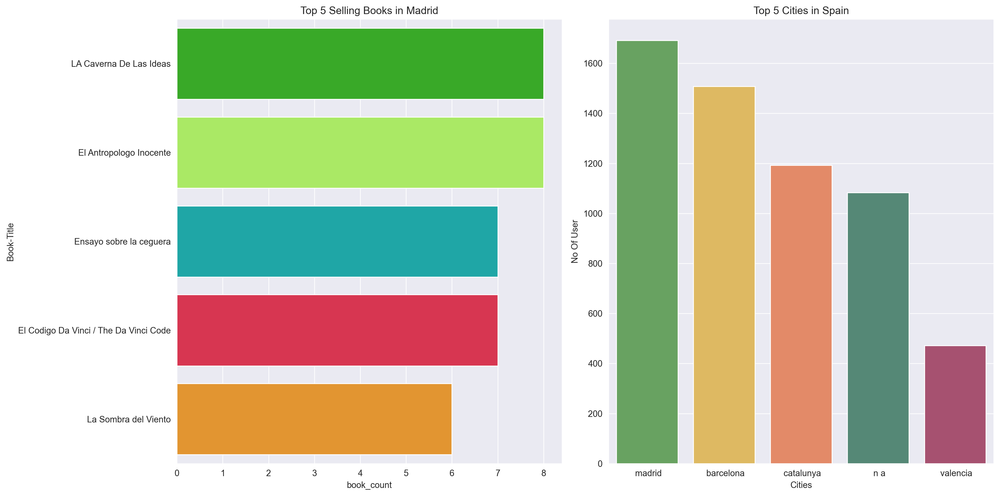

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Cities in Spain')
plt.setp(ax[1], xlabel = 'Cities')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x =user_loc[user_loc['country'] == ' spain'].iloc[:,2].value_counts().head(5).index,
            y= user_loc[user_loc['country'] == ' spain'].iloc[:,2].value_counts().head(5).values,
            ax = ax[1],
            palette=['#5fad56','#f2c14e','#f78154','#4d9078','#b4436c'])

plt.setp(ax[0], title = 'Top 5 Selling Books in Madrid')
plt.setp(ax[0], xlabel = 'Book Title')
plt.setp(ax[0], ylabel = '')
sns.barplot(y = madrid_top_book['Book-Title'],
            x = madrid_top_book['book_count'], ax = ax[0],
            palette=['#29bf12','#abff4f','#08bdbd','#f21b3f','#ff9914'])

plt.tight_layout()


- This graph shows **Madrid's best-selling** book and the top **five European cities**.

- We were looking for the **most active users** and **best seller** top city.

- We can recommend user books **depending on location** using the data, same as Instagram, Youtube and other services do for us when they suggest videos in real life.

#### Visualizing Rating

##### Adding Dataset

In [ ]:
rate = ratings.iloc[:,1:]
rate['rating'] = rate['rating'].apply(round)

rate.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,0
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,5
2,60973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,5
3,374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,4
4,393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,0


In [ ]:
rate['Publisher'].value_counts().head(5)

Harlequin           7524
Silhouette          4190
Pocket              3896
Ballantine Books    3775
Bantam Books        3640
Name: Publisher, dtype: int64

###### Harlequin

In [ ]:
Harlequin = rate[rate['Publisher'] == 'Harlequin']
Harlequin_Author = Harlequin['Book-Author'].value_counts().index

Harlequin_Author

Index(['Betty Neels', 'Author Unknown', 'Janet Dailey', 'Carole Mortimer',
       'Emma Darcy', 'Penny Jordan', 'David P. Jordan', 'Rebecca Winters',
       'Jim Wilson', 'Fern Michaels',
       ...
       'Julie Leto', 'Karen Hughes', 'Heather Warren', 'Mara Fox',
       'Gillen Cathy Thacker', 'Selina Sinclair', 'WENDY DOUGLAS',
       'Betty Nells', 'Karen Rose Smith', 'Debbie Rawlins'],
      dtype='object', length=1294)

In [ ]:
Author_rating =[]

for i in Harlequin_Author:
  a = rate[rate['Book-Author'] == i].loc[:,'rating'].mean()
  Author_rating.append(a)

In [ ]:
Harlequin_Author_Ranking = pd.DataFrame({
    'Author' : Harlequin_Author,
    'rating' : Author_rating
})

Harlequin_Author_Ranking['rating'].value_counts()

0.000000    401
2.000000     63
1.000000     61
0.500000     27
3.000000     23
           ... 
2.052632      1
0.809524      1
3.142857      1
0.937500      1
2.918919      1
Name: rating, Length: 351, dtype: int64

In [ ]:
Harlequin_Author_Ranking[Harlequin_Author_Ranking['rating'] >= 7].iloc[:,0]

781            J. Haley
834      Louella Nelson
890               Power
1030        Emily Mesta
1184    Samantha Hunter
1185    Elizabeth Rolls
Name: Author, dtype: object

In [ ]:
user_list = []

for i in Harlequin['ISBN']:

    user = ratings_raw[ratings_raw['ISBN'] == i].loc[:,'User-ID'].values
    for y in user:
        c = user_loc.iloc[y-1,3]
        user_list.append(c)

In [ ]:
Harlequin_user_list = pd.DataFrame({'country' : user_list})

Harlequin_user_list['country'].value_counts().head(10)

 usa                   1892
 canada                 187
 germany                 72
                         33
 iran                    22
 dominican republic      16
 malaysia                14
 n a                     12
 australia                7
 united kingdom           7
Name: country, dtype: int64

###### Silhouette

In [ ]:
Silhouette = rate[rate['Publisher'] == 'Silhouette']
Silhouette_Author = Silhouette['Book-Author'].value_counts().index

Silhouette_Author

Index(['Nora Roberts', 'Diana Palmer', 'Marie Ferrarella', 'Susan Mallery',
       'Carla Cassidy', 'Christine Rimmer', 'Annette Broadrick',
       'Lindsay McKenna', 'Linda Howard', 'Jackie Merritt',
       ...
       'Diana Duncan', 'Claire King', 'Patricia Carro', 'Kate Bradley',
       'Edith St. George', 'Jackie Weger', 'Deborah Gordon', 'Angela Benson',
       'Mona Van Wieren', 'Rebecca Russell'],
      dtype='object', length=793)

In [ ]:
Author_rating =[]

for i in Silhouette_Author:
  a = rate[rate['Book-Author'] == i].loc[:,'rating'].mean()
  Author_rating.append(a)

In [ ]:
Silhouette_Author_Ranking = pd.DataFrame({
    'Author' : Silhouette_Author,
    'rating' : Author_rating
})

Silhouette_Author_Ranking['rating'].apply(round).value_counts()

3      52
2     201
1     207
0     270
4      31
5      17
6       6
7       4
10      3
9       1
8       1
Name: rating, dtype: int64

In [ ]:
Silhouette_Author_Ranking.sort_values('rating', ascending=False).head(5)

,Author,rating
749,Cherly Biggs,10.0
495,Marley Morgan,10.0
702,Patricia Mae White,10.0
571,T. Myrna,9.0
656,Dawn Flindt,8.0


In [ ]:
Silhouette_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5)

749          Cherly Biggs
495         Marley Morgan
702    Patricia Mae White
571              T. Myrna
656           Dawn Flindt
Name: Author, dtype: object

In [ ]:
user_list = []

for i in Silhouette['ISBN']:

    user = ratings_raw[ratings_raw['ISBN'] == i].loc[:,'User-ID'].values
    for y in user:
        c = user_loc.iloc[y-1,3]
        user_list.append(c)

In [ ]:
Silhouette_user_list = pd.DataFrame({'country':user_list})

Silhouette_user_list['country'].value_counts().head(10)

 usa                   922
 canada                 65
 germany                32
 united kingdom         23
 iran                   20
 australia              13
 malaysia                9
 n a                     9
 dominican republic      8
                         7
Name: country, dtype: int64

###### Pocket

In [ ]:
Pocket = rate[rate['Publisher'] == 'Pocket']
Pocket_Author = Pocket['Book-Author'].value_counts().index

Pocket_Author

Index(['Agatha Christie', 'Jude Deveraux', 'V.C. Andrews', 'Kelli M. Gary',
       'Linda Lael Miller', 'Janet Dailey', 'Larry McMurtry',
       'Judith McNaught', 'Clive Cussler', 'Dick Francis',
       ...
       'John Comer', 'Thomas French', 'Diane Haeger', 'Gregory H Hemingway',
       'Diana Killian', 'John Luciew', 'Judith Henry Wall', 'Lynne Heitman',
       'Anne Robinson', 'Richard Rosenthal'],
      dtype='object', length=1706)

In [ ]:
Author_rating =[]

for i in Pocket_Author:
  a = rate[rate['Book-Author'] == i].loc[:,'rating'].mean()
  Author_rating.append(a)

In [ ]:
Pocket_Author_Ranking = pd.DataFrame({
    'Author' : Pocket_Author,
    'rating' : Author_rating
})

Pocket_Author_Ranking['rating'].apply(round).value_counts()

0     423
2     375
3     306
4     202
1     180
5      80
6      52
8      32
7      24
10     18
9      14
Name: rating, dtype: int64

In [ ]:
Pocket_Author_Ranking.sort_values('rating', ascending=False).head(5)

,Author,rating
1507,Mourlevat,10.0
649,Hayden,10.0
1284,Susan Osborn,10.0
1227,ROBA,10.0
1075,Khadra,10.0


In [ ]:
Pocket_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5)

1507       Mourlevat
649           Hayden
1284    Susan Osborn
1227            ROBA
1075          Khadra
Name: Author, dtype: object

In [ ]:
user_list = []

for i in Pocket['ISBN']:

    user = ratings_raw[ratings_raw['ISBN'] == i].loc[:,'User-ID'].values
    for y in user:
        c = user_loc.iloc[y-1,3]
        user_list.append(c)

In [ ]:
Pocket_user_list = pd.DataFrame({'country':user_list})

Pocket_user_list['country'].value_counts().head(10)

 usa               2254
 canada             285
                     84
 france              36
 united kingdom      26
 n a                 24
 australia           24
 germany             22
 netherlands         17
 malaysia            16
Name: country, dtype: int64

###### Ballantine Books

In [ ]:
Ballantine_Books = rate[rate['Publisher'] == 'Ballantine Books']
Ballantine_Books_Author = Ballantine_Books['Book-Author'].value_counts().index

Ballantine_Books_Author

Index(['Jim Davis', 'Anne Rice', 'Anne Perry', 'David Eddings', 'John Irving',
       'Michael Crichton', 'Jon Hassler', 'Bertrice Small', 'Terry Brooks',
       'Erle Stanley Gardner',
       ...
       'Arthur Schlesinger', 'Arnold Rampersad', 'Bruce Goldberg',
       'Frederic Raphael', 'William Emms', 'Roald Dahl', 'Arlene J. Chai',
       'Beatrice Shalit', 'Marta Moreno Vega Ph.D.', 'Robin Wright'],
      dtype='object', name='Book-Author', length=1939)

In [ ]:
Author_rating =[]

for i in Ballantine_Books_Author:
  a = rate[rate['Book-Author'] == i].loc[:,'rating'].mean()
  Author_rating.append(a)

In [ ]:
Ballantine_Books_Author_Ranking = pd.DataFrame({
    'Author' : Ballantine_Books_Author,
    'rating' : Author_rating
})

Ballantine_Books_Author_Ranking['rating'].apply(round).value_counts()

rating
0     481
2     391
3     333
4     234
1     188
5     111
6      83
8      37
7      36
10     28
9      17
Name: count, dtype: int64

In [ ]:
Ballantine_Books_Author_Ranking.sort_values('rating', ascending=False).head(5)

,Author,rating
1691,RICHARD COX,10.0
666,Lung Cheng,10.0
675,Martin Goldstein D.V.M.,10.0
831,Loren Baritz,10.0
858,Mason Wiley,10.0


In [ ]:
Ballantine_Books_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5)

1691                RICHARD COX
666                  Lung Cheng
675     Martin Goldstein D.V.M.
831                Loren Baritz
858                 Mason Wiley
Name: Author, dtype: object

In [ ]:
user_list = []

for i in Ballantine_Books['ISBN']:

    user = ratings_raw[ratings_raw['ISBN'] == i].loc[:,'User-ID'].values
    for y in user:
        c = user_loc.iloc[y-1,3]
        user_list.append(c)

In [ ]:
Ballantine_Books_user_list = pd.DataFrame({'country':user_list})

Ballantine_Books_user_list['country'].value_counts().head(10)

country
 usa               2428
 canada             343
                    107
 australia           45
 united kingdom      41
 n a                 26
 germany             18
 new zealand         15
 netherlands         13
 italy               10
Name: count, dtype: int64

###### Bantam Books

In [ ]:
Bantam_Books = rate[rate['Publisher'] == 'Bantam Books']
Bantam_Books_Author = Bantam_Books['Book-Author'].value_counts().index

Bantam_Books_Author

Index(['Francine Pascal', 'Louis L'Amour', 'Robert Ludlum', 'Rex Stout',
       'Dana Fuller Ross', 'Barbara Cartland', 'Donald Clayton Porter',
       'Don Coldsmith', 'Agatha Christie', 'Frederick Forsyth',
       ...
       'Baroness Emmuska Orczy', 'Margaret Weis', 'Anne Kolaczyk',
       'Katherine Kurtz', 'Stephen Kanar', 'Ian McEwan', 'Pat Frieder',
       'Ann Louise Gittleman', 'Sherry R. Anderson', 'Andrew Postman'],
      dtype='object', length=1667)

In [ ]:
Author_rating =[]

for i in Bantam_Books_Author:
  a = rate[rate['Book-Author'] == i].loc[:,'rating'].mean()
  Author_rating.append(a)

In [ ]:
Bantam_Books_Author_Ranking = pd.DataFrame({
    'Author' : Bantam_Books_Author,
    'rating' : Author_rating
})

Bantam_Books_Author_Ranking['rating'].apply(round).value_counts()

0     424
2     385
3     280
1     201
4     196
5      73
6      38
7      27
8      22
10     13
9       8
Name: rating, dtype: int64

In [ ]:
Bantam_Books_Author_Ranking.sort_values('rating', ascending=False).head(5)

,Author,rating
1044,Kenneth Flint,10.0
1461,Russel J. Reiter,10.0
1228,Carolyn Feleppa Balducci,10.0
835,Forrest Ackerman,10.0
1186,Mowar,10.0


In [ ]:
Bantam_Books_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5)

1044               Kenneth Flint
1461            Russel J. Reiter
1228    Carolyn Feleppa Balducci
835             Forrest Ackerman
1186                       Mowar
Name: Author, dtype: object

In [ ]:
user_list = []

for i in Bantam_Books['ISBN']:

    user = ratings_raw[ratings_raw['ISBN'] == i].loc[:,'User-ID'].values
    for y in user:
        c = user_loc.iloc[y-1,3]
        user_list.append(c)

In [ ]:
Bantam_Books_user_list = pd.DataFrame({'country':user_list})

Bantam_Books_user_list['country'].value_counts().head(10)

 usa               1333
 canada             155
                     39
 australia           30
 n a                 17
 malaysia            13
 new zealand         13
 germany             12
 united kingdom      10
 spain                8
Name: country, dtype: int64

##### Ploting Book Rating

<AxesSubplot:title={'center':'No Of Book/Rating'}, xlabel='Book Rating', ylabel='No Of Book'>

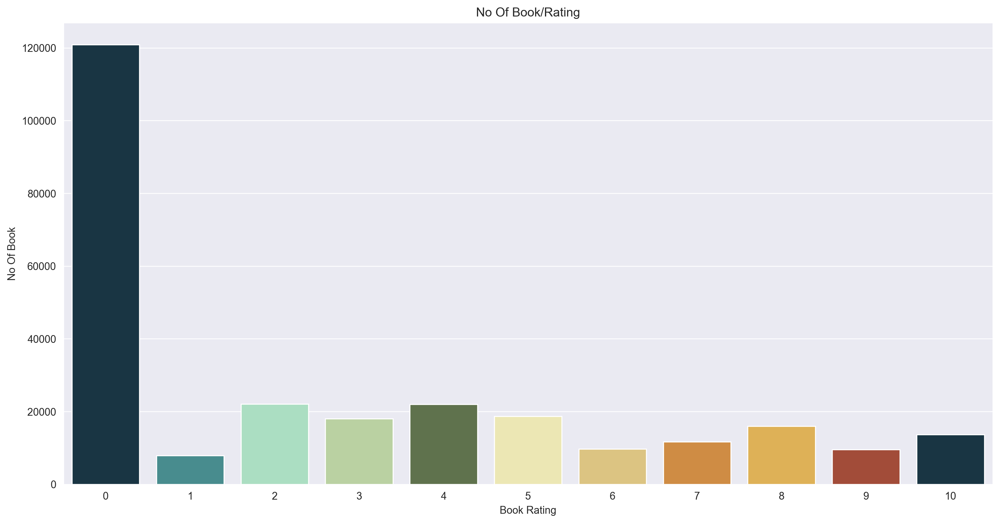

In [ ]:
plt.title('No Of Book/Rating')
plt.xlabel('Book Rating')
plt.ylabel ('No Of Book')
sns.barplot(x = rate['rating'].value_counts().index,
            y = rate['rating'].value_counts().values,
            palette = ['#12374a', '#3c979a', '#a3e6c1', '#bad99a', '#5f7847', '#f5efab', '#ebcb73', '#e68d2d', '#f5b840', '#b34127'])

- The graph **displays** the **number** of **books** per **rating**.

- We wanted to **know** how many **books were included** in each **ranting**.

- Rating is a **crucial piece of information without which** we can't **build** a model.

##### Ploting Publishers and Their Market Share

<AxesSubplot:title={'center':"Each Publisher's Market Share"}, ylabel='Publisher'>

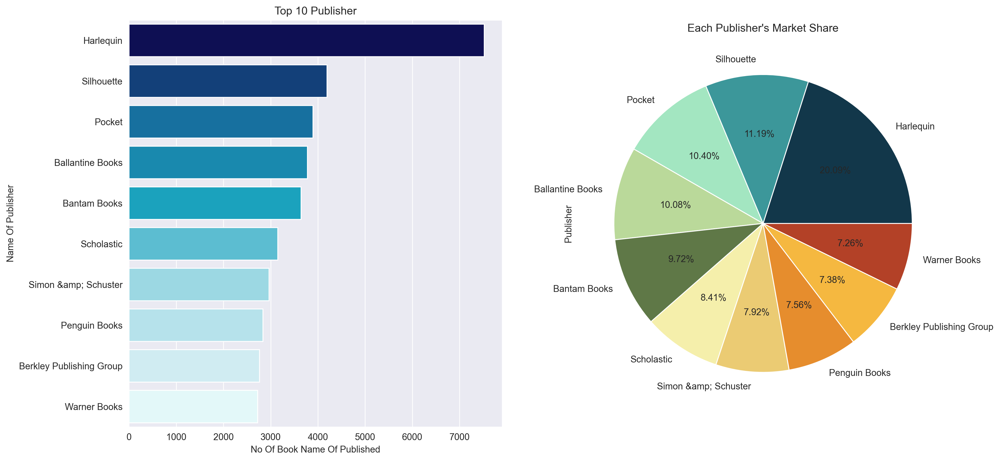

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Top 10 Publisher')
plt.setp(ax[0], xlabel = 'No Of Book Name Of Published')
plt.setp(ax[0], ylabel = 'Name Of Publisher')
sns.barplot(y = rate['Publisher'].value_counts().head(10).index, x = rate['Publisher'].value_counts().head(10).values, ax = ax[0],
            palette = ['#03045e', '#023e8a', '#0077b6', '#0096c7', '#00b4d8', '#48cae4', '#90e0ef', '#ade8f4', '#caf0f8', '#e0fbfc'])

plt.setp(ax[1], title = "Each Publisher's Market Share")
rate['Publisher'].value_counts().head(10).plot(kind='pie', autopct = '%.2f%%', ax = ax[1],
                                                colors=['#12374a', '#3c979a', '#a3e6c1', '#bad99a', '#5f7847', '#f5efab', '#ebcb73', '#e68d2d', '#f5b840', '#b34127'])

- The graph **displays** the top 10 **Publishers** together with their **market share**.

- We were curious about the **market share** of **large publishing** houses.

- We can utilise it for recommending book for user based on Publisher

###### Ploting Harlequin

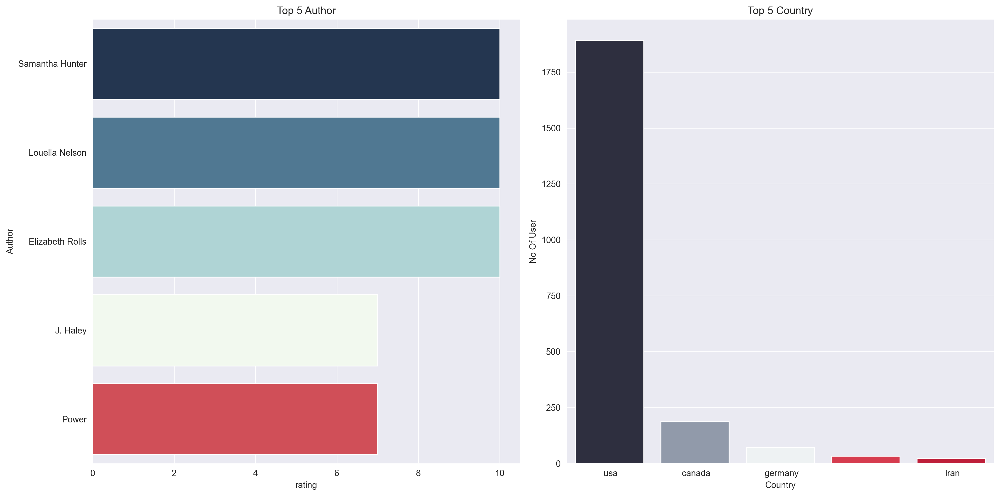

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Country')
plt.setp(ax[1], xlabel = 'Country')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x = Harlequin_user_list['country'].value_counts().head(5).index,
            y = Harlequin_user_list['country'].value_counts().head(5).values,
            ax = ax[1],
            palette = ['#2b2d42', '#8d99ae', '#edf2f4', '#ef233c', '#d90429'])

plt.setp(ax[0], title = 'Top 5 Author')
plt.setp(ax[0], xlabel = 'Author')
plt.setp(ax[0], ylabel = 'Rating')
sns.barplot(y = Harlequin_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5),
            x = Harlequin_Author_Ranking.sort_values('rating', ascending=False).loc[:,'rating'].head(5),
            ax = ax[0],
            palette = ['#1d3557', '#457b9d', '#a8dadc', '#f1faee', '#e63946'])

plt.tight_layout()

- In the graph, Top 5 **Harlequin author** and top 5 **country by active user**

- The top **author** of Harlequin and the country with the **highest** user base.

- We can utilise data to recommend user books from the same publishing house, similar to how we could advise further Marvel films if you've already watched one.

###### Ploting Silhouette

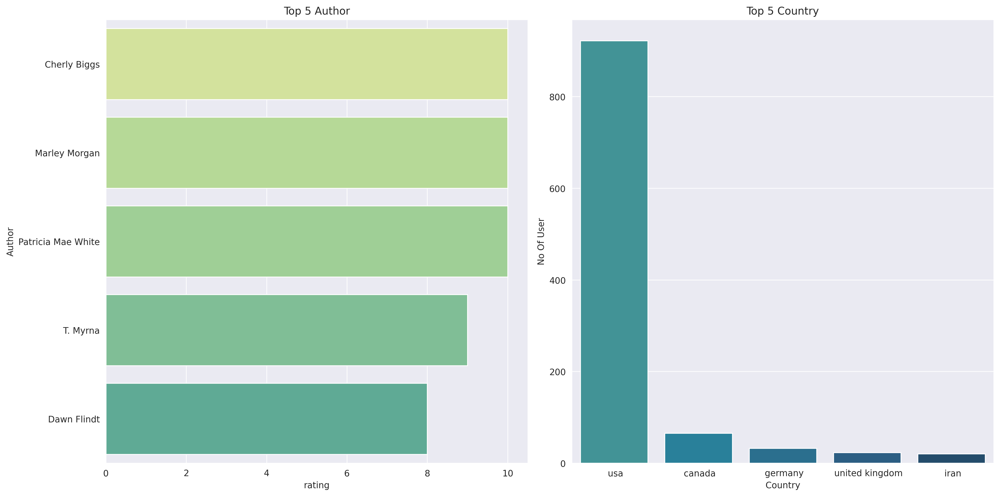

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Country')
plt.setp(ax[1], xlabel = 'Country')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x = Silhouette_user_list['country'].value_counts().head(5).index,
            y = Silhouette_user_list['country'].value_counts().head(5).values,
            ax = ax[1],
            palette = ['#34a0a4', '#168aad', '#1a759f', '#1e6091', '#184e77'])

plt.setp(ax[0], title = 'Top 5 Author')
plt.setp(ax[0], xlabel = 'Author')
plt.setp(ax[0], ylabel = 'Rating')
sns.barplot(y = Silhouette_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5),
            x = Silhouette_Author_Ranking.sort_values('rating', ascending=False).loc[:,'rating'].head(5),
            ax = ax[0],
            palette = ['#d9ed92', '#b5e48c', '#99d98c', '#76c893', '#52b69a'])

plt.tight_layout()

###### Ploting Pocket

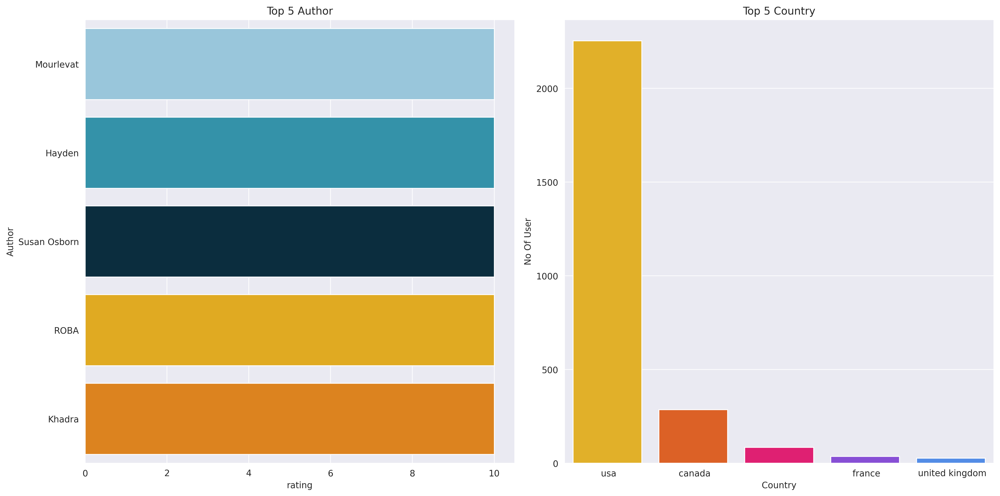

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Country')
plt.setp(ax[1], xlabel = 'Country')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x = Pocket_user_list['country'].value_counts().head(5).index,
            y = Pocket_user_list['country'].value_counts().head(5).values,
            ax = ax[1],
            palette = ['#ffbe0b', '#fb5607', '#ff006e', '#8338ec', '#3a86ff'])

plt.setp(ax[0], title = 'Top 5 Author')
plt.setp(ax[0], xlabel = 'Author')
plt.setp(ax[0], ylabel = 'Rating')
sns.barplot(y = Pocket_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5),
            x = Pocket_Author_Ranking.sort_values('rating', ascending=False).loc[:,'rating'].head(5),
            ax = ax[0],
            palette = ['#8ecae6', '#219ebc', '#023047', '#ffb703', '#fb8500'])

plt.tight_layout()

###### Ploting Ballantine Books

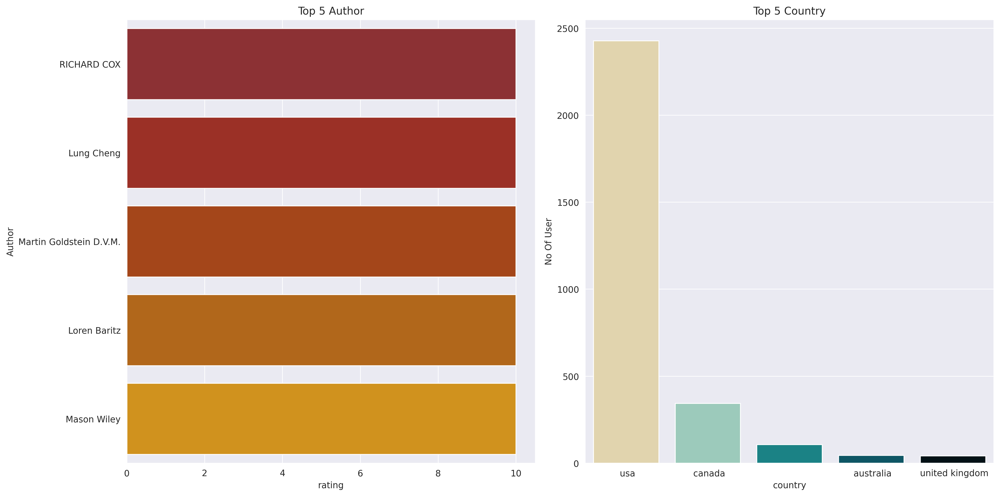

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Country')
plt.setp(ax[1], xlabel = 'Country')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x = Ballantine_Books_user_list['country'].value_counts().head(5).index,
            y = Ballantine_Books_user_list['country'].value_counts().head(5).values,
            ax = ax[1],
            palette = ['#e9d8a6', '#94d2bd', '#0a9396', '#005f73', '#001219'])

plt.setp(ax[0], title = 'Top 5 Author')
plt.setp(ax[0], xlabel = 'Author')
plt.setp(ax[0], ylabel = 'Rating')
sns.barplot(y = Ballantine_Books_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5),
            x = Ballantine_Books_Author_Ranking.sort_values('rating', ascending=False).loc[:,'rating'].head(5),
            ax = ax[0],
            palette = ['#9b2226', '#ae2012', '#bb3e03', '#ca6702', '#ee9b00'])

plt.tight_layout()

###### Ploting Bantam Books

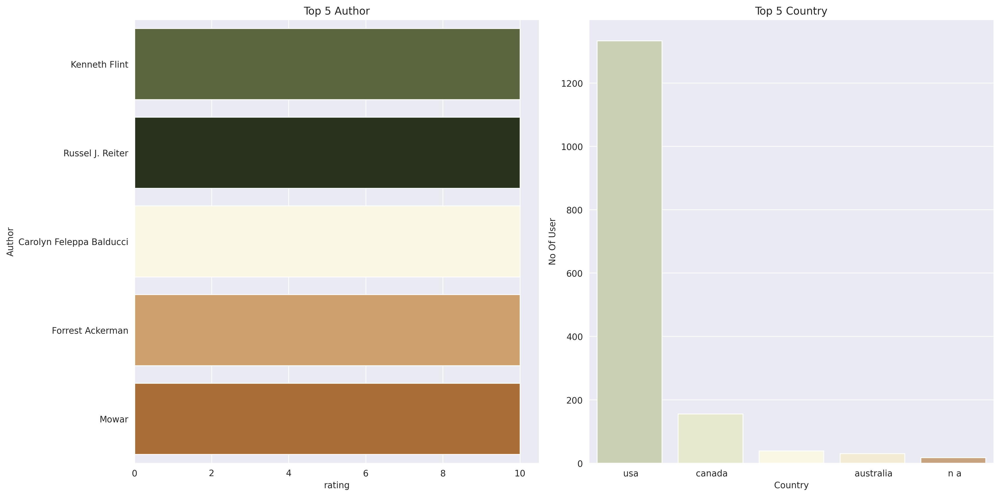

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[1], title = 'Top 5 Country')
plt.setp(ax[1], xlabel = 'Country')
plt.setp(ax[1], ylabel = 'No Of User')
sns.barplot(x = Bantam_Books_user_list['country'].value_counts().head(5).index,
            y = Bantam_Books_user_list['country'].value_counts().head(5).values,
            ax = ax[1],
            palette = ['#ccd5ae', '#e9edc9', '#fefae0', '#faedcd', '#d4a373'])

plt.setp(ax[0], title = 'Top 5 Author')
plt.setp(ax[0], xlabel = 'Author')
plt.setp(ax[0], ylabel = 'Rating')
sns.barplot(y = Bantam_Books_Author_Ranking.sort_values('rating', ascending=False).loc[:,'Author'].head(5),
            x = Bantam_Books_Author_Ranking.sort_values('rating', ascending=False).loc[:,'rating'].head(5),
            ax = ax[0],
            palette = ['#606c38', '#283618', '#fefae0', '#dda15e', '#bc6c25'])

plt.tight_layout()

In [ ]:
what why how

#### Visualizing Age

##### Filltering Age

In [ ]:
filltered_user = users_raw.query("Age >= 8 and Age < 80").iloc[:,[0,2]]
filltered_user['Age'] = filltered_user['Age'].apply(lambda x: int(x))

filltered_user

,User-ID,Age
1,2,18
3,4,17
5,6,61
9,10,26
10,11,14
...,...,...
278848,278849,23
278850,278851,33
278851,278852,32
278852,278853,17


In [ ]:
def cast_user(x):
    if x >= 8 and x <= 12:
        return 'Children'
    elif x > 12 and x <= 17:
        return 'Teenager'
    elif x > 17 and x <= 24:
        return 'Youngster'
    elif x > 24 and x <= 65:
        return 'Adult'
    elif x > 65:
        return 'Elder'
    else :
        return 'other'

In [ ]:
filltered_user['Age_Type'] = filltered_user['Age'].apply(cast_user)

filltered_user

,User-ID,Age,Age_Type
1,2,18,Youngster
3,4,17,Teenager
5,6,61,Adult
9,10,26,Adult
10,11,14,Teenager
...,...,...,...
278848,278849,23,Youngster
278850,278851,33,Adult
278851,278852,32,Adult
278852,278853,17,Teenager


In [ ]:
filltered_user['Age_Type'].value_counts()

Adult        119695
Youngster     32004
Teenager      10844
Elder          3453
Children        513
Name: Age_Type, dtype: int64

###### Adult

In [ ]:
Adult =  filltered_user[filltered_user['Age_Type'] == 'Adult']

Adult.reset_index(inplace=True)
Adult.drop(columns='index', inplace = True)

Adult

,User-ID,Age,Age_Type
0,6,61,Adult
1,10,26,Adult
2,13,26,Adult
3,18,25,Adult
4,21,46,Adult
...,...,...,...
119690,278843,28,Adult
119691,278844,28,Adult
119692,278851,33,Adult
119693,278852,32,Adult


In [ ]:
Adult['country'] = Adult['User-ID'].apply(lambda x :user_loc[user_loc['User-ID'] == x].loc[:,'country'].values[0])

Adult

,User-ID,Age,Age_Type,country
0,6,61,Adult,usa
1,10,26,Adult,spain
2,13,26,Adult,spain
3,18,25,Adult,brazil
4,21,46,Adult,spain
...,...,...,...,...
119690,278843,28,Adult,usa
119691,278844,28,Adult,usa
119692,278851,33,Adult,usa
119693,278852,32,Adult,australia


In [ ]:
Adult['country'].value_counts().head(5)

usa              57635
unitedkingdom     9220
spain             8459
canada            8118
germany           7485
Name: country, dtype: int64

In [ ]:
Adult_top_user = pd.DataFrame({
    'Country' : Adult['country'].value_counts().head(5).index,
    "No-Of-Reader's" : Adult['country'].value_counts().head(5).values
})

Adult_top_user.replace('unitedkingdom', 'uk', inplace = True)

Adult_top_user

,Country,No-Of-Reader's
0,usa,57635
1,uk,9220
2,spain,8459
3,canada,8118
4,germany,7485


In [ ]:
Adult['Book-Rating'] = Adult['User-ID'].apply(lambda x :ratings_raw[ratings_raw['User-ID'] == x].loc[:,'Book-Rating'].mean())

Adult

,User-ID,Age,Age_Type,country,Book-Rating
0,6,61,Adult,usa,NaN
1,10,26,Adult,spain,3.000000
2,13,26,Adult,spain,NaN
3,18,25,Adult,brazil,NaN
4,21,46,Adult,spain,NaN
...,...,...,...,...,...
119690,278843,28,Adult,usa,2.406250
119691,278844,28,Adult,usa,6.333333
119692,278851,33,Adult,usa,3.956522
119693,278852,32,Adult,australia,8.000000


In [ ]:
Adult['Book-Rating'].fillna(0, inplace = True)
Adult['Book-Rating'] = Adult['Book-Rating'].apply(lambda x : round(x))

Adult

,User-ID,Age,Age_Type,country,Book-Rating
0,6,61,Adult,usa,0
1,10,26,Adult,spain,3
2,13,26,Adult,spain,0
3,18,25,Adult,brazil,0
4,21,46,Adult,spain,0
...,...,...,...,...,...
119690,278843,28,Adult,usa,2
119691,278844,28,Adult,usa,6
119692,278851,33,Adult,usa,4
119693,278852,32,Adult,australia,8


In [ ]:
Adult_book = []

for i in range(len(Adult['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == Adult['User-ID'][i]]
    for j in b['ISBN']:
        Adult_book.append(j)

In [ ]:
Ad_book = pd.DataFrame({'ISBN': Adult_book})

Ad_top_book = pd.DataFrame(Ad_book.value_counts().head(5), columns=["Reader's"])
Ad_top_book.reset_index(inplace = True)
Ad_top_book['Book-Title'] = Ad_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

Ad_top_book

,ISBN,Reader's,Book-Title
0,0971880107,1590,Wild Animus
1,0316666343,770,The Lovely Bones: A Novel
2,0385504209,581,The Da Vinci Code
3,0060928336,431,Divine Secrets of the Ya-Ya Sisterhood: A Novel
4,0671027360,415,Angels &amp; Demons


###### Youngster

In [ ]:
Youngster =  filltered_user[filltered_user['Age_Type'] == 'Youngster']

Youngster.reset_index(inplace=True)
Youngster.drop(columns='index', inplace = True)

Youngster

,User-ID,Age,Age_Type
0,2,18,Youngster
1,20,19,Youngster
2,24,19,Youngster
3,28,24,Youngster
4,29,19,Youngster
...,...,...,...
31999,278803,24,Youngster
32000,278811,19,Youngster
32001,278835,18,Youngster
32002,278846,23,Youngster


In [ ]:
Youngster['country'] = Youngster['User-ID'].apply(lambda x :user_loc[user_loc['User-ID'] == x].loc[:,'country'].values[0])

Youngster

,User-ID,Age,Age_Type,country
0,2,18,Youngster,usa
1,20,19,Youngster,usa
2,24,19,Youngster,germany
3,28,24,Youngster,germany
4,29,19,Youngster,mexico
...,...,...,...,...
31999,278803,24,Youngster,china
32000,278811,19,Youngster,china
32001,278835,18,Youngster,pakistan
32002,278846,23,Youngster,canada


In [ ]:
Youngster['country'].value_counts().head(5)

usa              10563
spain             3350
germany           2518
unitedkingdom     2245
canada            2071
Name: country, dtype: int64

In [ ]:
Youngster_top_user = pd.DataFrame({
    'Country' : Youngster['country'].value_counts().head(5).index,
    "No-Of-Reader's" : Youngster['country'].value_counts().head(5).values
})

Youngster_top_user

,Country,No-Of-Reader's
0,usa,10563
1,spain,3350
2,germany,2518
3,unitedkingdom,2245
4,canada,2071


In [ ]:
Youngster['Book-Rating'] = Youngster['User-ID'].apply(lambda x :ratings_raw[ratings_raw['User-ID'] == x].loc[:,'Book-Rating'].mean())

Youngster

,User-ID,Age,Age_Type,country,Book-Rating
0,2,18,Youngster,usa,0.00
1,20,19,Youngster,usa,0.00
2,24,19,Youngster,germany,NaN
3,28,24,Youngster,germany,NaN
4,29,19,Youngster,mexico,NaN
...,...,...,...,...,...
31999,278803,24,Youngster,china,NaN
32000,278811,19,Youngster,china,NaN
32001,278835,18,Youngster,pakistan,NaN
32002,278846,23,Youngster,canada,4.00


In [ ]:
Youngster['Book-Rating'].fillna(0, inplace = True)
Youngster['Book-Rating'] = Youngster['Book-Rating'].apply(lambda x : round(x))

Youngster

,User-ID,Age,Age_Type,country,Book-Rating
0,2,18,Youngster,usa,0
1,20,19,Youngster,usa,0
2,24,19,Youngster,germany,0
3,28,24,Youngster,germany,0
4,29,19,Youngster,mexico,0
...,...,...,...,...,...
31999,278803,24,Youngster,china,0
32000,278811,19,Youngster,china,0
32001,278835,18,Youngster,pakistan,0
32002,278846,23,Youngster,canada,4


In [ ]:
Youngster_book = []

for i in range(len(Youngster['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == Youngster['User-ID'][i]]
    for j in b['ISBN']:
        Youngster_book.append(j)

In [ ]:
Yt_book = pd.DataFrame({'ISBN': Youngster_book})

Yt_top_book = pd.DataFrame(Yt_book.value_counts().head(5), columns=["Reader's"])
Yt_top_book.reset_index(inplace = True)
Yt_top_book['Book-Title'] = Yt_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

Yt_top_book

,ISBN,Reader's,Book-Title
0,0971880107,386,Wild Animus
1,0316666343,107,The Lovely Bones: A Novel
2,0316769487,83,The Catcher in the Rye
3,0385504209,78,The Da Vinci Code
4,059035342X,76,Harry Potter and the Sorcerer's Stone (Harry P...


###### Teenager

In [ ]:
Teenager =  filltered_user[filltered_user['Age_Type'] == 'Teenager']

Teenager.reset_index(inplace=True)
Teenager.drop(columns='index', inplace = True)

Teenager

,User-ID,Age,Age_Type
0,4,17,Teenager
1,11,14,Teenager
2,19,14,Teenager
3,35,17,Teenager
4,41,14,Teenager
...,...,...,...
10839,278785,16,Teenager
10840,278794,14,Teenager
10841,278818,15,Teenager
10842,278838,15,Teenager


In [ ]:
Teenager['country'] = Teenager['User-ID'].apply(lambda x :user_loc[user_loc['User-ID'] == x].loc[:,'country'].values[0])

Teenager

,User-ID,Age,Age_Type,country
0,4,17,Teenager,portugal
1,11,14,Teenager,australia
2,19,14,Teenager,
3,35,17,Teenager,usa
4,41,14,Teenager,usa
...,...,...,...,...
10839,278785,16,Teenager,germany
10840,278794,14,Teenager,usa
10841,278818,15,Teenager,usa
10842,278838,15,Teenager,usa


In [ ]:
Teenager['country'].value_counts().head(5)

usa              4691
australia        1376
canada            773
spain             692
unitedkingdom     568
Name: country, dtype: int64

In [ ]:
Teenager_top_user = pd.DataFrame({
    'Country' : Teenager['country'].value_counts().head(5).index,
    "No-Of-Reader's" : Teenager['country'].value_counts().head(5).values
})

Teenager_top_user.replace('unitedkingdom', 'uk', inplace = True)

Teenager_top_user

,Country,No-Of-Reader's
0,usa,4691
1,australia,1376
2,canada,773
3,spain,692
4,uk,568


In [ ]:
Teenager['Book-Rating'] = Teenager['User-ID'].apply(lambda x :ratings_raw[ratings_raw['User-ID'] == x].loc[:,'Book-Rating'].mean())

Teenager

,User-ID,Age,Age_Type,country,Book-Rating
0,4,17,Teenager,portugal,NaN
1,11,14,Teenager,australia,NaN
2,19,14,Teenager,,7.0
3,35,17,Teenager,usa,NaN
4,41,14,Teenager,usa,NaN
...,...,...,...,...,...
10839,278785,16,Teenager,germany,NaN
10840,278794,14,Teenager,usa,NaN
10841,278818,15,Teenager,usa,9.5
10842,278838,15,Teenager,usa,0.0


In [ ]:
Teenager['Book-Rating'].fillna(0, inplace = True)
Teenager['Book-Rating'] = Teenager['Book-Rating'].apply(lambda x : round(x))

Teenager

,User-ID,Age,Age_Type,country,Book-Rating
0,4,17,Teenager,portugal,0
1,11,14,Teenager,australia,0
2,19,14,Teenager,,7
3,35,17,Teenager,usa,0
4,41,14,Teenager,usa,0
...,...,...,...,...,...
10839,278785,16,Teenager,germany,0
10840,278794,14,Teenager,usa,0
10841,278818,15,Teenager,usa,10
10842,278838,15,Teenager,usa,0


In [ ]:
Teenager_book = []

for i in range(len(Teenager['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == Teenager['User-ID'][i]]
    for j in b['ISBN']:
        Teenager_book.append(j)

In [ ]:
Teen_book = pd.DataFrame({'ISBN': Teenager_book})

Teen_top_book = pd.DataFrame(Teen_book.value_counts().head(5), columns=["Reader's"])
Teen_top_book.reset_index(inplace = True)
Teen_top_book['Book-Title'] = Teen_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

Teen_top_book

,ISBN,Reader's,Book-Title
0,0971880107,118,Wild Animus
1,0312979479,35,And Then There Were None : A Novel
2,0446310786,29,To Kill a Mockingbird
3,059035342X,26,Harry Potter and the Sorcerer's Stone (Harry P...
4,0440219078,24,The Giver (21st Century Reference)


###### Elder

In [ ]:
Elder =  filltered_user[filltered_user['Age_Type'] == 'Elder']

Elder.reset_index(inplace=True)
Elder.drop(columns='index', inplace = True)

Elder

,User-ID,Age,Age_Type
0,172,66,Elder
1,221,79,Elder
2,483,72,Elder
3,540,67,Elder
4,722,66,Elder
...,...,...,...
3448,278621,74,Elder
3449,278622,68,Elder
3450,278739,66,Elder
3451,278807,66,Elder


In [ ]:
Elder['country'] = Elder['User-ID'].apply(lambda x :user_loc[user_loc['User-ID'] == x].loc[:,'country'].values[0])

Elder

,User-ID,Age,Age_Type,country
0,172,66,Elder,brazil
1,221,79,Elder,usa
2,483,72,Elder,usa
3,540,67,Elder,usa
4,722,66,Elder,usa
...,...,...,...,...
3448,278621,74,Elder,canada
3449,278622,68,Elder,usa
3450,278739,66,Elder,canada
3451,278807,66,Elder,usa


In [ ]:
Elder['country'].value_counts().head(5)

usa              2402
canada            236
australia         181
unitedkingdom     177
newzealand         68
Name: country, dtype: int64

In [ ]:
Elder_top_user = pd.DataFrame({
    'Country' : Elder['country'].value_counts().head(5).index,
    "No-Of-Reader's" : Elder['country'].value_counts().head(5).values
})

Elder_top_user

,Country,No-Of-Reader's
0,usa,2402
1,canada,236
2,australia,181
3,unitedkingdom,177
4,newzealand,68


In [ ]:
Elder['Book-Rating'] = Elder['User-ID'].apply(lambda x :ratings_raw[ratings_raw['User-ID'] == x].loc[:,'Book-Rating'].mean())

Elder

,User-ID,Age,Age_Type,country,Book-Rating
0,172,66,Elder,brazil,NaN
1,221,79,Elder,usa,10.0
2,483,72,Elder,usa,0.0
3,540,67,Elder,usa,NaN
4,722,66,Elder,usa,NaN
...,...,...,...,...,...
3448,278621,74,Elder,canada,8.0
3449,278622,68,Elder,usa,NaN
3450,278739,66,Elder,canada,NaN
3451,278807,66,Elder,usa,10.0


In [ ]:
Elder['Book-Rating'].fillna(0, inplace = True)
Elder['Book-Rating'] = Elder['Book-Rating'].apply(lambda x : round(x))

Elder

,User-ID,Age,Age_Type,country,Book-Rating
0,172,66,Elder,brazil,0
1,221,79,Elder,usa,10
2,483,72,Elder,usa,0
3,540,67,Elder,usa,0
4,722,66,Elder,usa,0
...,...,...,...,...,...
3448,278621,74,Elder,canada,8
3449,278622,68,Elder,usa,0
3450,278739,66,Elder,canada,0
3451,278807,66,Elder,usa,10


In [ ]:
Elder_book = []

for i in range(len(Elder['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == Elder['User-ID'][i]]
    for j in b['ISBN']:
        Elder_book.append(j)

In [ ]:
El_book = pd.DataFrame({'ISBN': Elder_book})

El_top_book = pd.DataFrame(El_book.value_counts().head(5), columns=["Reader's"])
El_top_book.reset_index(inplace = True)
El_top_book['Book-Title'] = Ad_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

El_top_book

,ISBN,Reader's,Book-Title
0,0971880107,35,Wild Animus
1,0385504209,20,The Lovely Bones: A Novel
2,0440241073,11,The Da Vinci Code
3,0316666343,11,Divine Secrets of the Ya-Ya Sisterhood: A Novel
4,067976402X,10,Angels &amp; Demons


###### Children

In [ ]:
Children =  filltered_user[filltered_user['Age_Type'] == 'Children']

Children.reset_index(inplace=True)
Children.drop(columns='index', inplace = True)

Children

,User-ID,Age,Age_Type
0,1178,9,Children
1,1384,12,Children
2,1851,9,Children
3,3554,11,Children
4,3792,12,Children
...,...,...,...
508,277991,12,Children
509,278425,12,Children
510,278524,10,Children
511,278525,12,Children


In [ ]:
Children['country'] = Children['User-ID'].apply(lambda x :user_loc[user_loc['User-ID'] == x].loc[:,'country'].values[0])

Children

,User-ID,Age,Age_Type,country
0,1178,9,Children,germany
1,1384,12,Children,usa
2,1851,9,Children,australia
3,3554,11,Children,usa
4,3792,12,Children,usa
...,...,...,...,...
508,277991,12,Children,usa
509,278425,12,Children,portugal
510,278524,10,Children,
511,278525,12,Children,usa


In [ ]:
Children['country'].value_counts().head(5)

usa              287
canada            58
australia         44
unitedkingdom     40
newzealand        17
Name: country, dtype: int64

In [ ]:
Children_top_user = pd.DataFrame({
    'Country' : Children['country'].value_counts().head(5).index,
    "No-Of-Reader's" : Children['country'].value_counts().head(5).values
})

Children_top_user

,Country,No-Of-Reader's
0,usa,287
1,canada,58
2,australia,44
3,unitedkingdom,40
4,newzealand,17


In [ ]:
Children['Book-Rating'] = Children['User-ID'].apply(lambda x :ratings_raw[ratings_raw['User-ID'] == x].loc[:,'Book-Rating'].mean())

Children

,User-ID,Age,Age_Type,country,Book-Rating
0,1178,9,Children,germany,5.166667
1,1384,12,Children,usa,NaN
2,1851,9,Children,australia,NaN
3,3554,11,Children,usa,0.000000
4,3792,12,Children,usa,4.285714
...,...,...,...,...,...
508,277991,12,Children,usa,NaN
509,278425,12,Children,portugal,6.000000
510,278524,10,Children,,2.500000
511,278525,12,Children,usa,9.000000


In [ ]:
Children['Book-Rating'].fillna(0, inplace = True)
Children['Book-Rating'].apply(lambda x : round(x))

Children

,User-ID,Age,Age_Type,country,Book-Rating
0,1178,9,Children,germany,5.166667
1,1384,12,Children,usa,0.000000
2,1851,9,Children,australia,0.000000
3,3554,11,Children,usa,0.000000
4,3792,12,Children,usa,4.285714
...,...,...,...,...,...
508,277991,12,Children,usa,0.000000
509,278425,12,Children,portugal,6.000000
510,278524,10,Children,,2.500000
511,278525,12,Children,usa,9.000000


In [ ]:
Children['Book-Rating'] = Children['Book-Rating'].apply(lambda x : round(x))

Children

,User-ID,Age,Age_Type,country,Book-Rating
0,1178,9,Children,germany,5
1,1384,12,Children,usa,0
2,1851,9,Children,australia,0
3,3554,11,Children,usa,0
4,3792,12,Children,usa,4
...,...,...,...,...,...
508,277991,12,Children,usa,0
509,278425,12,Children,portugal,6
510,278524,10,Children,,2
511,278525,12,Children,usa,9


In [ ]:
Children_book = []

for i in range(len(Children['User-ID'])):
    b = ratings_raw[ratings_raw['User-ID'] == Children['User-ID'][i]]
    for j in b['ISBN']:
        Children_book.append(j)

In [ ]:
child_book = pd.DataFrame({'ISBN': Children_book})

child_top_book = pd.DataFrame(child_book.value_counts().head(5), columns=["Reader's"])
child_top_book.reset_index(inplace = True)
child_top_book['Book-Title'] = child_top_book['ISBN'].apply(lambda x: book_raw[book_raw['ISBN'] == x].loc[:,'Book-Title'].values[0])

child_top_book

,ISBN,Reader's,Book-Title
0,059035342X,8,Harry Potter and the Sorcerer's Stone (Harry P...
1,0439049962,7,Captain Underpants and the Invasion of the Inc...
2,0064407667,6,The Bad Beginning (A Series of Unfortunate Eve...
3,0590483498,6,"Night of the Living Dummy II (Goosebumps, No 31)"
4,0590453661,6,"Stay Out of the Basement (Goosebumps, No 2)"


##### Ploting Age

<AxesSubplot:title={'center':'No Of User Per Age'}, ylabel='No Of User'>

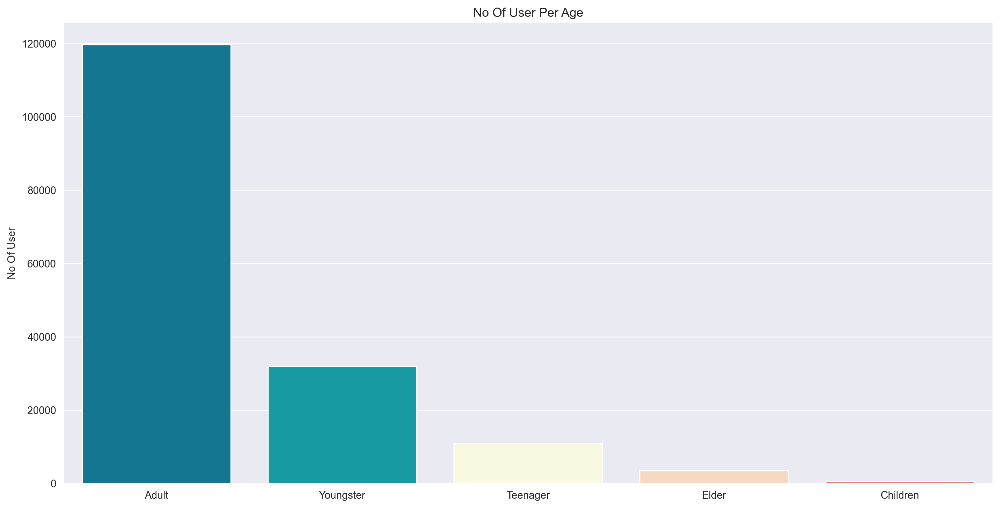

In [ ]:
plt.title('No Of User Per Age')
plt.ylabel('No Of User')
sns.barplot(x=filltered_user['Age_Type'].value_counts().index,
            y=filltered_user['Age_Type'].value_counts().values,
            palette=['#0081a7','#00afb9','#fdfcdc','#fed9b7','#f07167'])

###### Adult

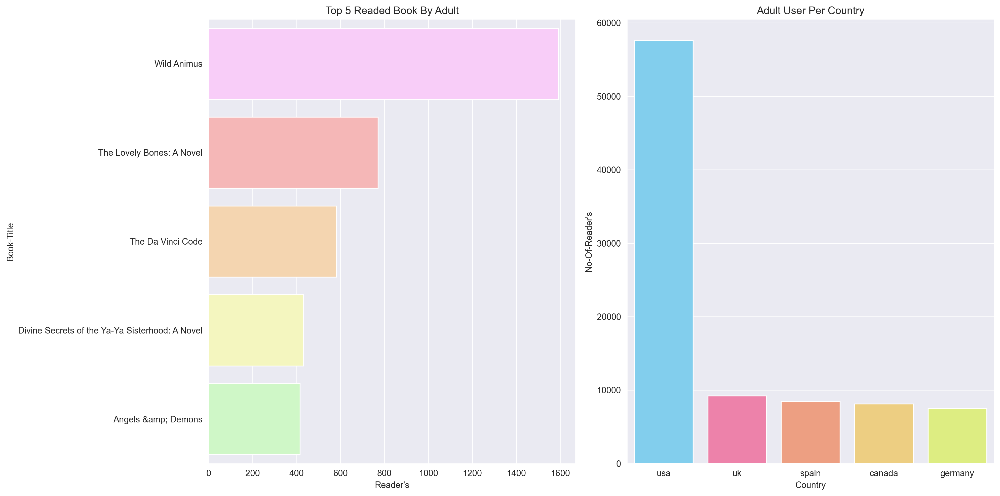

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Top 5 Readed Book By Adult')
sns.barplot(y = Ad_top_book['Book-Title'],
            x = Ad_top_book["Reader's"],
            ax = ax[0],
            palette=['#ffc6ff','#ffadad','#ffd6a5','#fdffb6','#caffbf'])

plt.setp(ax[1], title = 'Adult User Per Country')
sns.barplot(x = Adult_top_user['Country'],
            y = Adult_top_user["No-Of-Reader's"],
            ax = ax[1],
            palette=['#70d6ff','#ff70a6','#ff9770','#ffd670','#e9ff70'])

plt.tight_layout()

###### Youngster

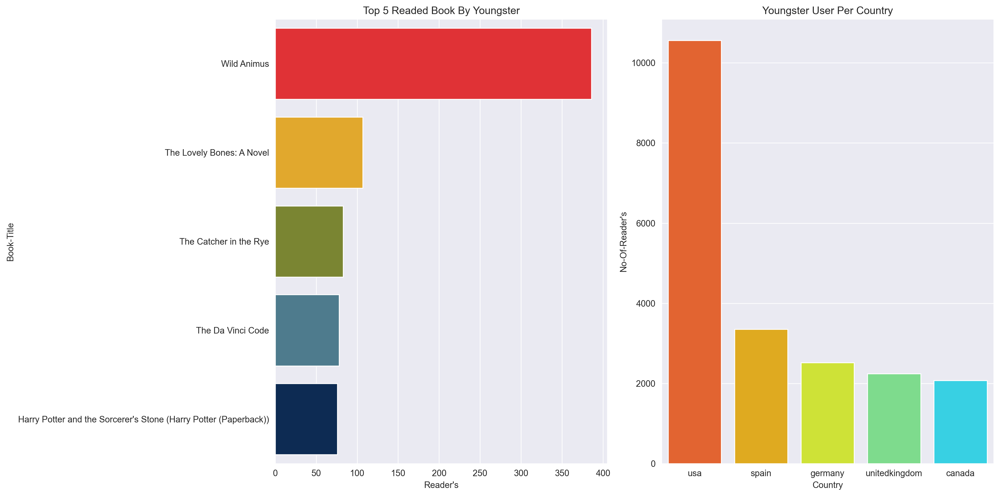

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Top 5 Readed Book By Youngster')
sns.barplot(y = Yt_top_book['Book-Title'],
            x = Yt_top_book["Reader's"],
            ax = ax[0],
            palette=['#fd151b','#ffb30f','#849324','#437f97','#01295f'])

plt.setp(ax[1], title = 'Youngster User Per Country')
sns.barplot(x = Youngster_top_user['Country'],
            y = Youngster_top_user["No-Of-Reader's"],
            ax = ax[1],
            palette=['#ff5714','#ffb800','#e4ff1a','#6eeb83','#1be7ff'])

plt.tight_layout()

###### Teenager

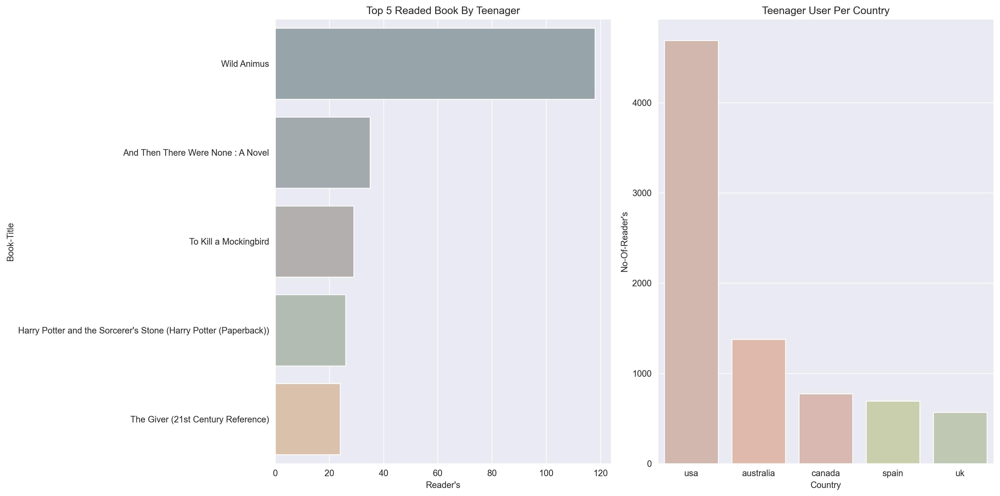

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Top 5 Readed Book By Teenager')
sns.barplot(y = Teen_top_book['Book-Title'],
            x = Teen_top_book["Reader's"],
            ax = ax[0],
            palette=['#94a7ad','#a2aaae','#b3b0ae','#b3bfb2','#e1c1a4'])

plt.setp(ax[1], title = 'Teenager User Per Country')
sns.barplot(x = Teenager_top_user['Country'],
            y = Teenager_top_user["No-Of-Reader's"],
            ax = ax[1],
            palette=['#d5b6aa','#e6b8a3','#deb4a9','#cdd3a7','#bfccaf'])

plt.tight_layout()

###### Elder

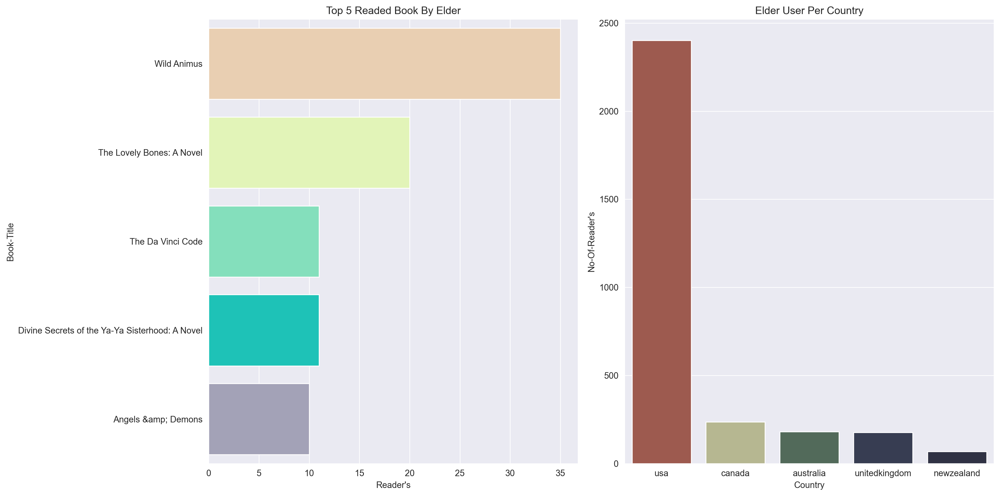

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Top 5 Readed Book By Elder')
sns.barplot(y = El_top_book['Book-Title'],
            x = El_top_book["Reader's"],
            ax = ax[0],
            palette=['#f2d0a9','#e6feae','#75eebf','#03ddcf','#a09ebb'])

plt.setp(ax[1], title = 'Elder User Per Country')
sns.barplot(x = Elder_top_user['Country'],
            y = Elder_top_user["No-Of-Reader's"],
            ax = ax[1],
            palette=['#aa5042','#bcbd8b','#4e6e58','#333a56','#2d3047'])

plt.tight_layout()

###### Children

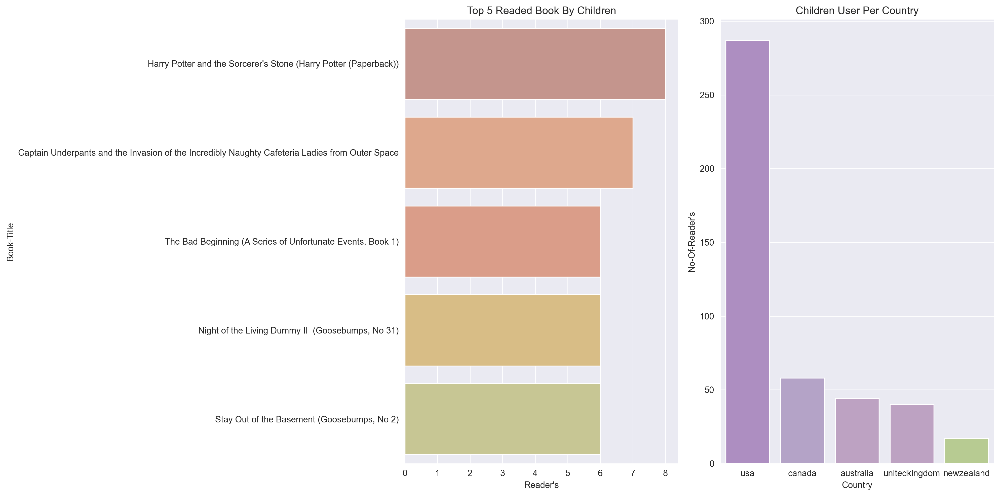

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Top 5 Readed Book By Children')
sns.barplot(y = child_top_book['Book-Title'],
            x = child_top_book["Reader's"],
            ax = ax[0],
            palette=['#cd8e84','#eca47f','#e8967b','#e6c278','#d0ce8b'])

plt.setp(ax[1], title = 'Children User Per Country')
sns.barplot(x = Children_top_user['Country'],
            y = Children_top_user["No-Of-Reader's"],
            ax = ax[1],
            palette=['#af85ca','#b49dcd','#c19dc7','#c19dc7','#bad588'])

plt.tight_layout()

#### Compairing Ranting Per Age

##### Creating DataFrame

In [ ]:
df = pd.DataFrame(
    {
        'No-Of-User' : Adult['Book-Rating'].value_counts().values,
        'Book-Rating' : Adult['Book-Rating'].value_counts().index,
        'User-Type' : 'Adult'
    }
)

df2 = pd.DataFrame(
    {
        'No-Of-User' : Youngster['Book-Rating'].value_counts().values,
        'Book-Rating' : Youngster['Book-Rating'].value_counts().index,
        'User-Type' : 'Youngster'
    }
)

df3 = pd.DataFrame(
    {
        'No-Of-User' : Teenager['Book-Rating'].value_counts().values,
        'Book-Rating' : Teenager['Book-Rating'].value_counts().index,
        'User-Type' : 'Teenager'
    }
)

df4 = pd.DataFrame(
    {
        'No-Of-User' : Elder['Book-Rating'].value_counts().values,
        'Book-Rating' : Elder['Book-Rating'].value_counts().index,
        'User-Type' : 'Elder'
    }
)

df5 = pd.DataFrame(
    {
        'No-Of-User' : Children['Book-Rating'].value_counts().values,
        'Book-Rating' : Children['Book-Rating'].value_counts().index,
        'User-Type' : 'Children'
    }
)


In [ ]:
r = df.append(df2)
r2 = r.append(df3)
r3 = r2.append(df4)
result = r3.append(df5)

result

,No-Of-User,Book-Rating,User-Type
0,85413,0,Adult
1,5388,8,Adult
2,4580,4,Adult
3,3944,7,Adult
4,3851,5,Adult
5,3502,6,Adult
6,3438,3,Adult
7,3189,2,Adult
8,2618,10,Adult
9,2366,9,Adult


In [ ]:
non_zero_result = result.drop(0)

non_zero_result

,No-Of-User,Book-Rating,User-Type
1,5388,8,Adult
2,4580,4,Adult
3,3944,7,Adult
4,3851,5,Adult
5,3502,6,Adult
6,3438,3,Adult
7,3189,2,Adult
8,2618,10,Adult
9,2366,9,Adult
10,1406,1,Adult


##### Ploting With Zero

<AxesSubplot:title={'center':'No Of User Per Rating'}, xlabel='Book-Rating', ylabel='No-Of-User'>

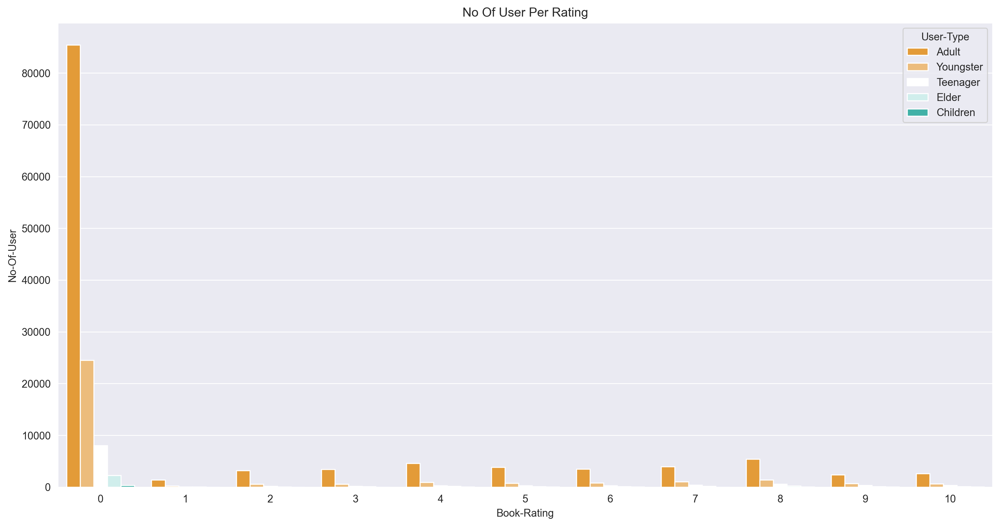

In [ ]:
plt.title('No Of User Per Rating')

sns.barplot(y = result['No-Of-User'],
            x = result['Book-Rating'],
            hue =result['User-Type'],
            palette = ['#ff9f1c','#ffbf69','#ffffff','#cbf3f0','#2ec4b6'])

##### Ploting Without Zero

<AxesSubplot:title={'center':'No Of User Per Rating(Non-Zero)'}, xlabel='Book-Rating', ylabel='No-Of-User'>

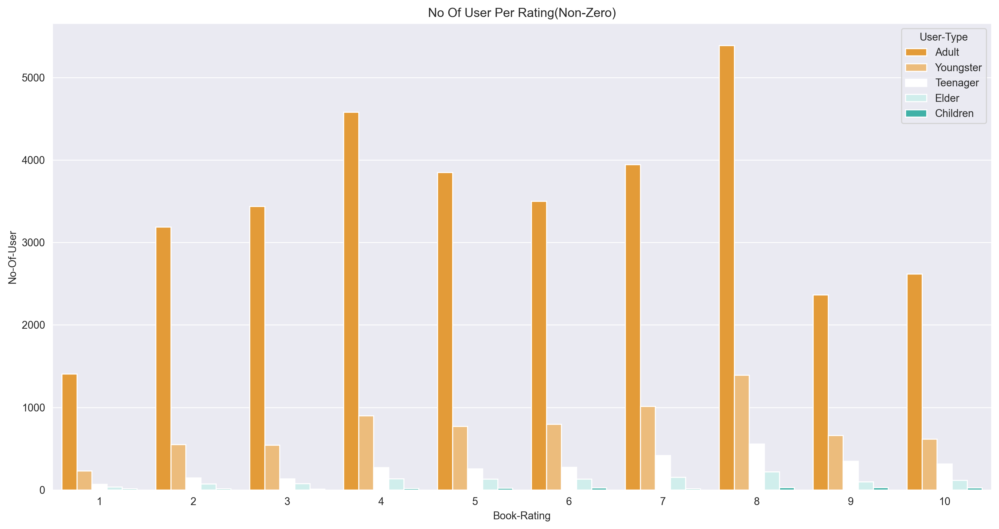

In [ ]:
plt.title('No Of User Per Rating(Non-Zero)')

sns.barplot(y = non_zero_result['No-Of-User'],
            x = non_zero_result['Book-Rating'],
            hue =non_zero_result['User-Type'],
            palette = ['#ff9f1c','#ffbf69','#ffffff','#cbf3f0','#2ec4b6'])

##### Ploting Pie-Plot

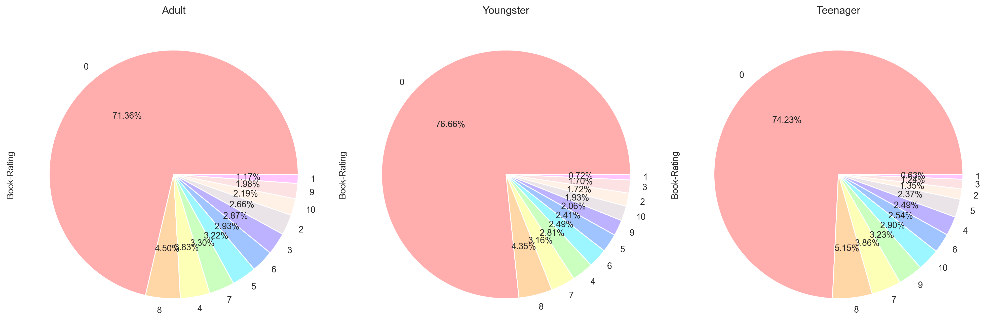

In [ ]:
fig, ax = plt.subplots(ncols = 3)

plt.setp(ax[0], title = 'Adult')
Adult['Book-Rating'].value_counts().plot(kind='pie', autopct = '%.2f%%', ax = ax[0],
            colors=['#ffadad','#ffd6a5','#fdffb6','#caffbf','#9bf6ff','#a0c4ff','#bdb2ff','#eae4e9','#fff1e6','#fde2e4','#ffc6ff'])

plt.setp(ax[1], title = 'Youngster')
Youngster['Book-Rating'].value_counts().plot(kind='pie', autopct = '%.2f%%', ax = ax[1],
            colors=['#ffadad','#ffd6a5','#fdffb6','#caffbf','#9bf6ff','#a0c4ff','#bdb2ff','#eae4e9','#fff1e6','#fde2e4','#ffc6ff'])

plt.setp(ax[2], title = 'Teenager')
Teenager['Book-Rating'].value_counts().plot(kind='pie', autopct = '%.2f%%', ax = ax[2],
            colors=['#ffadad','#ffd6a5','#fdffb6','#caffbf','#9bf6ff','#a0c4ff','#bdb2ff','#eae4e9','#fff1e6','#fde2e4','#ffc6ff'])

plt.tight_layout()

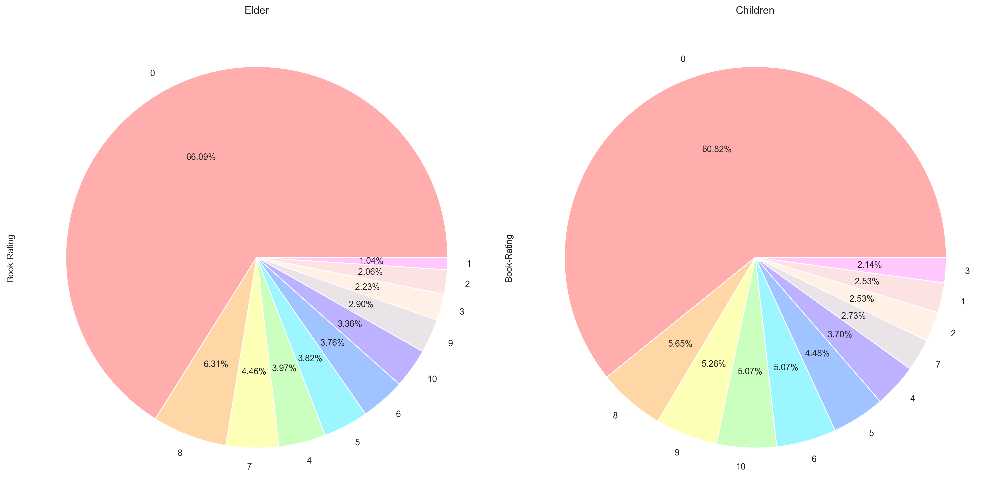

In [ ]:
fig, ax = plt.subplots(ncols = 2)

plt.setp(ax[0], title = 'Elder')
Elder['Book-Rating'].value_counts().plot(kind='pie', autopct = '%.2f%%', ax = ax[0],
            colors=['#ffadad','#ffd6a5','#fdffb6','#caffbf','#9bf6ff','#a0c4ff','#bdb2ff','#eae4e9','#fff1e6','#fde2e4','#ffc6ff'])

plt.setp(ax[1], title = 'Children')
Children['Book-Rating'].value_counts().plot(kind='pie', autopct = '%.2f%%', ax = ax[1],
            colors=['#ffadad','#ffd6a5','#fdffb6','#caffbf','#9bf6ff','#a0c4ff','#bdb2ff','#eae4e9','#fff1e6','#fde2e4','#ffc6ff'])

plt.tight_layout()

## Creating DataFrame For Model Building

In [ ]:
ratings_raw.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [ ]:
ratings.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,rating
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,0.000000
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,4.928571
2,60973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,5.000000
3,374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,4.272727
4,393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,0.000000


In [ ]:
user_loc.head()

,User-ID,area,city,country
0,1,nyc,newyork,usa
1,2,stockton,california,usa
2,3,moscow,yukonterritory,russia
3,4,porto,vngaia,portugal
4,5,farnborough,hants,unitedkingdom


In [ ]:
filltered_user.head()

,User-ID,Age,Age_Type
1,2,18,Youngster
3,4,17,Teenager
5,6,61,Adult
9,10,26,Adult
10,11,14,Teenager


In [ ]:
eda1 = ratings_raw['User-ID']

eda1.head()

0    276725
1    276726
2    276727
3    276729
4    276729
Name: User-ID, dtype: int64

In [ ]:
eda2 = []

for i in eda1:
    a = user_loc[user_loc['User-ID'] == i].loc[:,'country'].values[0]
    eda2.append(a)

In [ ]:
eda2

['usa',
 'usa',
 'australia',
 'croatia',
 'croatia',
 'france',
 'austria',
 'australia',
 'usa',
 'germany',
 '',
 '',
 '',
 '',
 '',
 '',
 'usa',
 'usa',
 'usa',
 'usa',
 'usa',
 'usa',
 'usa',
 'usa',
 'saudiarabia',
 'saudiarabia',
 'switzerland',
 'switzerland',
 'canada',
 'germany',
 'spain',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'netherlands',
 'netherlands',
 'germany',
 'germany',
 'germany',
 'germany',
 'germany',
 'switzerland',
 'switzerland',
 'switzerland',
 'switzerland',
 'switzerland',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'spain',
 'usa',
 'usa',
 'usa',
 'unitedkingdom',
 'unitedkingdom',
 'germany',
 'ge

In [ ]:
users_raw[users_raw['User-ID'] == 276725].loc[:,'Age'].values[0]

nan

In [ ]:
eda3 =[]

for i in eda1:
    a = users_raw[users_raw['User-ID'] == i].loc[:,'Age'].values[0]
    eda3.append(a)

In [ ]:
eda5 = ratings_raw['ISBN']

eda5

0           034545104X
1           0155061224
2           0446520802
3           052165615X
4           0521795028
              ...     
1149775     1563526298
1149776     0679447156
1149777     0515107662
1149778     0590442449
1149779    05162443314
Name: ISBN, Length: 1149780, dtype: object

In [ ]:
ratings[ratings['ISBN'] == '0155061224'].shape[0]

0

In [ ]:
eda4 = []

for i in eda5:
    print(i)
    if ratings[ratings['ISBN'] == i].shape[0] == 0:
        eda4.append(np.nan)

    else:
        a = ratings[ratings['ISBN'] == i].loc[:,'Publisher'].values[0]
        eda4.append(a)

034545104X
0155061224
0446520802
052165615X
0521795028
2080674722
3257224281
0600570967
038550120X
342310538
0425115801
0449006522
0553561618
055356451X
0786013990
0786014512
0060517794
0451192001
0609801279
0671537458
0679776818
0943066433
1570231028
1885408226
0747558167
3442437407
033390804X
3596218098
0684867621
0451166892
8440682697
034544003X
0380000059
0380711524
0451167317
0451454952
0843920262
3404122879
3404182928
3404611306
342662429
3426690179
3442424216
3442425573
3453092007
3453157745
3453176944
3453185137
3453185323
3453213025
3453877241
3492226604
3517017442
3596125006
B0000BLD7X
N3453124715
9029716894
9057868059
0140279091
0553572369
0571058086
3499230933
3596151465
0099543818
3404147723
3423111321
3442136644
3492232000
8434811634
8484330478
8484332039
2864322102
8402065945
8423314901
842333533X
8427911769
8433914456
8437606322
8445072919
8466300821
847765011X
8478442588
8495368099
0345443683
043935806X
055310666X
0330332775
0330367358
0006379702
3423084049
3442131340


### Creating Area

In [ ]:
area = ratings_raw.copy()
area['country'] = eda2

area

,User-ID,ISBN,Book-Rating,country
0,276725,034545104X,0,usa
1,276726,0155061224,5,usa
2,276727,0446520802,0,australia
3,276729,052165615X,3,croatia
4,276729,0521795028,6,croatia
...,...,...,...,...
1149775,276704,1563526298,9,usa
1149776,276706,0679447156,0,canada
1149777,276709,0515107662,10,usa
1149778,276721,0590442449,10,usa


In [ ]:
area[area['country']=='usa']

In [ ]:
area.to_csv('Area.csv', index=False)

### Creating Age

In [ ]:
age = area = ratings_raw.copy()
age['age'] = eda3
age['Age_Type'] = age['age'].apply(cast_user)

age

,User-ID,ISBN,Book-Rating,age,Age_Type
0,276725,034545104X,0,NaN,None
1,276726,0155061224,5,NaN,None
2,276727,0446520802,0,16.0,Teenager
3,276729,052165615X,3,16.0,Teenager
4,276729,0521795028,6,16.0,Teenager
...,...,...,...,...,...
1149775,276704,1563526298,9,NaN,None
1149776,276706,0679447156,0,18.0,Youngster
1149777,276709,0515107662,10,38.0,Adult
1149778,276721,0590442449,10,14.0,Teenager


In [ ]:
age['Age_Type'].fillna('Other',inplace=True)

age['Age_Type'].value_counts()

Adult        708098
Other        312572
Youngster     91355
Teenager      18360
Elder         15054
Children       4341
Name: Age_Type, dtype: int64

In [ ]:
age.drop(columns=['age'], inplace=True)

In [ ]:
age

,User-ID,ISBN,Book-Rating,Age_Type
0,276725,034545104X,0,Other
1,276726,0155061224,5,Other
2,276727,0446520802,0,Teenager
3,276729,052165615X,3,Teenager
4,276729,0521795028,6,Teenager
...,...,...,...,...
1149775,276704,1563526298,9,Other
1149776,276706,0679447156,0,Youngster
1149777,276709,0515107662,10,Adult
1149778,276721,0590442449,10,Teenager


In [ ]:
age.to_csv('Age.csv',index=False)

### Creating User

In [ ]:
count_area = pd.DataFrame(
        {
            'INDEX' : ratings_raw['User-ID'].value_counts().index,
            'COUNT' : ratings_raw['User-ID'].value_counts().values
        }
    )

count_area

,INDEX,COUNT
0,11676,13602
1,198711,7550
2,153662,6109
3,98391,5891
4,35859,5850
...,...,...
105278,116180,1
105279,116166,1
105280,116154,1
105281,116137,1


In [ ]:
d_area = count_area[count_area['COUNT'] < 100].loc[:,'INDEX'].values

In [ ]:
def Type(x):
    if x >=100:
        return 'old'
    else :
        return 'new'

In [ ]:
user = pd.DataFrame(
    {
        'User_Id' : users_raw['User-ID'],
        'Country' : user_loc['country'],
        'Age' : users_raw['Age']
    }
)

user

,User_Id,Country,Age
0,1,usa,NaN
1,2,usa,18.0
2,3,russia,NaN
3,4,portugal,17.0
4,5,unitedkingdom,NaN
...,...,...,...
278853,278854,usa,NaN
278854,278855,unitedkingdom,50.0
278855,278856,canada,NaN
278856,278857,usa,NaN


In [ ]:
def count(x):
    if count_area[count_area['INDEX'] == x].shape[0] == 0:
        return np.nan
    else :
        return count_area[count_area['INDEX'] == x].loc[:,'COUNT'].values[0]

In [ ]:
user['count'] = user['User_Id'].apply(lambda x: count(x))

user

,User_Id,Country,Age,count
0,1,usa,NaN,NaN
1,2,usa,18.0,1.0
2,3,russia,NaN,NaN
3,4,portugal,17.0,NaN
4,5,unitedkingdom,NaN,NaN
...,...,...,...,...
278853,278854,usa,NaN,8.0
278854,278855,unitedkingdom,50.0,NaN
278855,278856,canada,NaN,NaN
278856,278857,usa,NaN,NaN


In [ ]:
def area(x):
    if x == 'usa':
        return 'usa'

    elif x == 'canada':
        return 'canada'

    elif x == 'unitedkingdom':
        return 'unitedkingdom'

    elif x == 'australia':
        return 'australia'

    elif x == 'germany':
        return 'germany'

    else :
        return 'others'


In [ ]:
user['area'] = user['Country'].apply(lambda x: area(x))

user

,User_Id,Country,Age,count,area
0,1,usa,NaN,NaN,usa
1,2,usa,18.0,1.0,usa
2,3,russia,NaN,NaN,others
3,4,portugal,17.0,NaN,others
4,5,unitedkingdom,NaN,NaN,unitedkingdom
...,...,...,...,...,...
278853,278854,usa,NaN,8.0,usa
278854,278855,unitedkingdom,50.0,NaN,unitedkingdom
278855,278856,canada,NaN,NaN,canada
278856,278857,usa,NaN,NaN,usa


In [ ]:
user['age'] = user['Age'].apply(cast_user)

user

,User_Id,Country,Age,count,area,age
0,1,usa,NaN,NaN,usa,other
1,2,usa,18.0,1.0,usa,Youngster
2,3,russia,NaN,NaN,others,other
3,4,portugal,17.0,NaN,others,Teenager
4,5,unitedkingdom,NaN,NaN,unitedkingdom,other
...,...,...,...,...,...,...
278853,278854,usa,NaN,8.0,usa,other
278854,278855,unitedkingdom,50.0,NaN,unitedkingdom,Adult
278855,278856,canada,NaN,NaN,canada,other
278856,278857,usa,NaN,NaN,usa,other


In [ ]:
user['type'] = user['User_Id'].apply(lambda x: Type(x))

user

,User_Id,Country,Age,count,area,age,type
0,1,usa,NaN,NaN,usa,other,new
1,2,usa,18.0,1.0,usa,Youngster,new
2,3,russia,NaN,NaN,others,other,new
3,4,portugal,17.0,NaN,others,Teenager,new
4,5,unitedkingdom,NaN,NaN,unitedkingdom,other,new
...,...,...,...,...,...,...,...
278853,278854,usa,NaN,8.0,usa,other,old
278854,278855,unitedkingdom,50.0,NaN,unitedkingdom,Adult,old
278855,278856,canada,NaN,NaN,canada,other,old
278856,278857,usa,NaN,NaN,usa,other,old


In [ ]:
user.drop(columns=['Country', 'Age', 'count'], inplace = True)

user

,User_Id,area,age,type
0,1,usa,other,new
1,2,usa,Youngster,new
2,3,others,other,new
3,4,others,Teenager,new
4,5,unitedkingdom,other,new
...,...,...,...,...
278853,278854,usa,other,old
278854,278855,unitedkingdom,Adult,old
278855,278856,canada,other,old
278856,278857,usa,other,old


In [ ]:
user.to_csv('User.csv', index=False)